<a href="https://colab.research.google.com/github/RyosukeHanaoka/jcr2025/blob/main/swin_transformer_mcp_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 概要

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install vit_pytorch timm
from __future__ import print_function

import glob
import os
import random
import cv2
import shutil
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from PIL import Image
from torch.optim.lr_scheduler import StepLR
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets, transforms
from tqdm.notebook import tqdm
from pathlib import Path
import seaborn as sns
import timm
from pprint import pprint
from torch.optim.lr_scheduler import StepLR, CosineAnnealingLR, CosineAnnealingWarmRestarts
from torch.optim import AdamW
from torchvision import transforms

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.2/69.2 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.5/138.5 kB 12.0 MB/s eta 0:00:00


In [ ]:
# -----------------------------
# 乱数シード固定用関数
# -----------------------------
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True

# ここで好きなシード値を指定
seed = 42
seed_everything(seed)

# -----------------------------
# デバイス設定
# -----------------------------
device = "cuda" if torch.cuda.is_available() else "cpu"

# -----------------------------
# CSVファイルの読み込み
# -----------------------------
csv_path = "/content/drive/MyDrive/mcp_table.csv"
data = pd.read_csv(csv_path)

# 画像ファイルへのパスを生成 (filename 列を想定)
data['image_path'] = data.apply(
    lambda row: os.path.join("/content/drive/MyDrive/mcp_for_analysis", row["filename"]),
    axis=1
)

In [ ]:
batch_size=128
epochs = 300
lr = 5e-6
max_lr = 8e-5
gamma = 0.85
seed = 42
#dropout_of_model('swin_base_patch4_window7_224.ms_in1k')
drop_rate=0.3
attn_drop_rate=0.2
drop_path_rate=0.2
mixup_alpha=0.5
#optimizer's_settings(AdamW)
weight_decay=3e-3
#scheduler's_settings(CosineAnnealingWarmRestarts)
T_0=60
T_mult=2
eta_min=1e-6

train_transforms=transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(degrees=20),
    transforms.RandAugment(
        num_ops=2,
        magnitude=6
    ),
    transforms.RandomAffine(degrees=0, translate=(0.12, 0.12), scale=(0.85, 1.15)),
    transforms.ColorJitter(brightness=0.15, contrast=0.15, saturation=0.15, hue=0.05),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomPerspective(distortion_scale=0.15, p=0.4),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

test_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

class ImageDataset(Dataset):
    """
    RA画像データセット
    positive_class (diagnosis="RA"): RA患者の画像
    negative_class (diagnosis="control"): 非RA患者の画像
    """
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transform

        # クラスの分布を計算
        self.class_distribution = self.dataframe['diagnosis'].value_counts()
        print(f"Class distribution:")
        print(f"RA patients (diagnosis=RA): {self.class_distribution.get('RA', 0)}")
        print(f"Control subjects (diagnosis=control): {self.class_distribution.get('control', 0)}")

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_path = self.dataframe.iloc[idx]['image_path']
        image = Image.open(img_path).convert('RGB')

        # ラベルを数値に変換（1: RA, 0: control）
        label = 1 if self.dataframe.iloc[idx]['diagnosis'] == 'RA' else 0

        if self.transform:
            image = self.transform(image)

        return image, label

    def get_pos_weight(self):
        """
        クラス不均衡に対するポジティブクラスの重みを計算
        BCEWithLogitsLossのpos_weightパラメータとして使用可能
        """
        control_count = self.class_distribution.get('control', 0)
        ra_count = self.class_distribution.get('RA', 0)
        return torch.tensor([control_count / ra_count]) if ra_count > 0 else torch.tensor([1.0])
from sklearn.model_selection import train_test_split

# 元のデータをトレーニングセットとテストセットに分割
train_val_data, test_data = train_test_split(data, test_size=0.1, random_state=42)

# トレーニングセットをさらにトレーニングセットとバリデーションセットに分割
train_data, val_data = train_test_split(train_val_data, test_size=0.22, random_state=42)  # 0.22 ≈ 2/9

# トレーニング、バリデーション、テストセット用のデータセットとデータローダーを作成
train_dataset = ImageDataset(train_data, transform=train_transforms)
valid_dataset = ImageDataset(val_data, transform=val_transforms)
test_dataset = ImageDataset(test_data, transform=test_transforms)


# データローダーの設定を最適化
train_loader = DataLoader(
    dataset=train_dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=2,
    pin_memory=True,
    persistent_workers=True,
    prefetch_factor=2
)

valid_loader = DataLoader(
    dataset=valid_dataset,
    batch_size=batch_size,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
    persistent_workers=True
)

test_loader = DataLoader(
    dataset=test_dataset,
    batch_size=batch_size,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
    persistent_workers=True
)

model_names = timm.list_models(pretrained=True)
model = timm.create_model(
    'swin_base_patch4_window7_224.ms_in1k',
    pretrained=True,
    num_classes=2,
    drop_block_rate=None,
    drop_connect_rate=None,
    drop_rate=drop_rate,
    attn_drop_rate=attn_drop_rate,
    drop_path_rate=drop_path_rate,
)
# Google Colabでランタイプ：GPUにしている場合は必要
model.to("cuda:0")
# loss function
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
# criterion = nn.HuberLoss()
# optimizer
optimizer = AdamW(
    model.parameters(),
    lr=lr,
    weight_decay=weight_decay
)
from torch.optim.lr_scheduler import LinearLR, SequentialLR, CosineAnnealingWarmRestarts
"""
# Warmupスケジューラーの設定
warmup_epochs = 15
warmup_scheduler = LinearLR(
    optimizer,
    start_factor=1e-6/lr,  # 初期学習率/目標学習率
    end_factor=1.0,
    total_iters=warmup_epochs
)

# メインのスケジューラー（既存のCosineAnnealingWarmRestarts）
cosine_scheduler = CosineAnnealingWarmRestarts(
    optimizer,
    T_0=T_0,
    T_mult=T_mult,
    eta_min=eta_min
)

# 二つのスケジューラーを結合
scheduler = SequentialLR(
    optimizer,
    schedulers=[warmup_scheduler, cosine_scheduler],
    milestones=[warmup_epochs]
)

#scheduler = StepLR(optimizer, step_size=3, gamma=gamma)
scheduler = CosineAnnealingWarmRestarts(
    optimizer,
    T_0=T_0,
    T_mult=T_mult,
    eta_min=eta_min
)
"""
scheduler = torch.optim.lr_scheduler.OneCycleLR(
    optimizer,
    max_lr=max_lr,
    epochs=epochs,
    steps_per_epoch=len(train_loader),
    pct_start=0.2,
    anneal_strategy='cos',
    div_factor=15,
    final_div_factor=1e3
)

Class distribution:
RA patients (diagnosis=RA): 797
Control subjects (diagnosis=control): 1544
Class distribution:
RA patients (diagnosis=RA): 234
Control subjects (diagnosis=control): 424
Class distribution:
RA patients (diagnosis=RA): 107
Control subjects (diagnosis=control): 232


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/353M [00:00<?, ?B/s]

学習ループを設定し、実行していく

In [ ]:
import gc
from torchvision.utils import make_grid

import os
os.environ['PYTORCH_CUDA_ALLOC_CONF'] = ':'.join([
    'max_split_size_mb:128',
    'expandable_segments:True'
])

class Mixup:
    def __init__(self, alpha=mixup_alpha):
        self.alpha = alpha

    def __call__(self, batch, target):
        if self.alpha > 0:
            lam = np.random.beta(self.alpha, self.alpha)
        else:
            lam = 1

        batch_size = len(batch)
        index = torch.randperm(batch_size).to(batch.device)

        mixed_batch = lam * batch + (1 - lam) * batch[index, :]
        target_a, target_b = target, target[index]
        return mixed_batch, target_a, target_b, lam

def train_with_gradient_accumulation(model, train_loader, valid_loader, test_loader, criterion, optimizer, scheduler, device, epochs):
    accumulation_steps = 4
    effective_batch_size = batch_size
    actual_batch_size = effective_batch_size // accumulation_steps

    train_acc_list = []
    val_acc_list = []
    test_acc_list = []
    train_loss_list = []
    val_loss_list = []
    test_loss_list = []

    # 新しい指標のリストを追加
    val_sensitivity_list = []
    val_specificity_list = []
    val_f1_list = []
    test_sensitivity_list = []
    test_specificity_list = []
    test_f1_list = []

    scaler = torch.cuda.amp.GradScaler()
    mixup = Mixup(alpha=mixup_alpha)

    def calculate_metrics(outputs, labels):
        predictions = outputs.argmax(dim=1)
        tp = ((predictions == 1) & (labels == 1)).float().sum()
        tn = ((predictions == 0) & (labels == 0)).float().sum()
        fp = ((predictions == 1) & (labels == 0)).float().sum()
        fn = ((predictions == 0) & (labels == 1)).float().sum()

        sensitivity = tp / (tp + fn + 1e-7)
        specificity = tn / (tn + fp + 1e-7)
        precision = tp / (tp + fp + 1e-7)
        f1_score = 2 * (precision * sensitivity) / (precision + sensitivity + 1e-7)

        return sensitivity.item(), specificity.item(), f1_score.item()

    for epoch in range(epochs):
        model.train()
        epoch_loss = 0
        epoch_accuracy = 0
        optimizer.zero_grad()

        for i, (data, label) in enumerate(tqdm(train_loader)):
            with torch.cuda.amp.autocast():
                data = data.to(device)
                label = label.to(device)

                mixed_data, labels_a, labels_b, lam = mixup(data, label)

                output = model(mixed_data)
                loss = criterion(output, labels_a) * lam + criterion(output, labels_b) * (1 - lam)
                loss = loss / accumulation_steps

            scaler.scale(loss).backward()

            if ((i + 1) % accumulation_steps == 0) or (i + 1 == len(train_loader)):
                scaler.step(optimizer)
                scaler.update()
                optimizer.zero_grad(set_to_none=True)

            acc = (lam * (output.argmax(dim=1) == labels_a).float() +
                  (1 - lam) * (output.argmax(dim=1) == labels_b).float()).mean()
            epoch_accuracy += acc / len(train_loader)
            epoch_loss += loss * accumulation_steps / len(train_loader)

            del data, label, mixed_data, labels_a, labels_b, output, loss
            if (i + 1) % (accumulation_steps * 2) == 0:
                torch.cuda.empty_cache()

        # 検証フェーズ
        model.eval()
        with torch.no_grad():
            epoch_val_accuracy = 0
            epoch_val_loss = 0
            val_outputs = []
            val_labels = []

            for data, label in valid_loader:
                data = data.to(device)
                label = label.to(device)

                val_output = model(data)
                val_loss = criterion(val_output, label)

                val_outputs.append(val_output)
                val_labels.append(label)

                acc = (val_output.argmax(dim=1) == label).float().mean()
                epoch_val_accuracy += acc / len(valid_loader)
                epoch_val_loss += val_loss / len(valid_loader)

                del data, label, val_output, val_loss

            # 検証データセット全体での指標計算
            val_outputs = torch.cat(val_outputs)
            val_labels = torch.cat(val_labels)
            val_sensitivity, val_specificity, val_f1 = calculate_metrics(val_outputs, val_labels)

            # テストフェーズ
            epoch_test_accuracy = 0
            epoch_test_loss = 0
            test_outputs = []
            test_labels = []

            for data, label in tqdm(test_loader):
                data = data.to(device)
                label = label.to(device)

                test_output = model(data)
                test_loss = criterion(test_output, label)

                test_outputs.append(test_output)
                test_labels.append(label)

                acc = (test_output.argmax(dim=1) == label).float().mean()
                epoch_test_accuracy += acc / len(test_loader)
                epoch_test_loss += test_loss / len(test_loader)

                del data, label, test_output, test_loss

            # テストデータセット全体での指標計算
            test_outputs = torch.cat(test_outputs)
            test_labels = torch.cat(test_labels)
            test_sensitivity, test_specificity, test_f1 = calculate_metrics(test_outputs, test_labels)

            torch.cuda.empty_cache()

        # 結果の記録
        train_acc_list.append(epoch_accuracy)
        val_acc_list.append(epoch_val_accuracy)
        test_acc_list.append(epoch_test_accuracy)
        train_loss_list.append(epoch_loss)
        val_loss_list.append(epoch_val_loss)
        test_loss_list.append(epoch_test_loss)

        # 新しい指標の記録
        val_sensitivity_list.append(val_sensitivity)
        val_specificity_list.append(val_specificity)
        val_f1_list.append(val_f1)
        test_sensitivity_list.append(test_sensitivity)
        test_specificity_list.append(test_specificity)
        test_f1_list.append(test_f1)

        print(
            f"Epoch : {epoch+1} - "
            f"train_loss : {epoch_loss:.4f} - train_acc: {epoch_accuracy:.4f} - "
            f"val_loss : {epoch_val_loss:.4f} - val_acc: {epoch_val_accuracy:.4f} - "
            f"val_sensitivity: {val_sensitivity:.4f} - val_specificity: {val_specificity:.4f} - val_f1: {val_f1:.4f} - "
            f"test_loss : {epoch_test_loss:.4f} - test_acc: {epoch_test_accuracy:.4f} - "
            f"test_sensitivity: {test_sensitivity:.4f} - test_specificity: {test_specificity:.4f} - test_f1: {test_f1:.4f}\n"
        )

        scheduler.step()

    return (train_acc_list, val_acc_list, test_acc_list,
            train_loss_list, val_loss_list, test_loss_list,
            val_sensitivity_list, val_specificity_list, val_f1_list,
            test_sensitivity_list, test_specificity_list, test_f1_list)

# モデルの設定を最適化
def optimize_model_settings():
    # メモリ関連の設定を最適化
    torch.backends.cudnn.benchmark = True
    torch.backends.cuda.matmul.allow_tf32 = True

    # モデルの設定を最適化
    model.to(device)
    if hasattr(model, 'transformer'):
        for block in model.transformer.blocks:
            block.attn.fused_attn = True

    return model

def main():
    model = optimize_model_settings()
    metrics = train_with_gradient_accumulation(
        model, train_loader, valid_loader, test_loader, criterion, optimizer, scheduler, device, epochs
    )
    return (model, *metrics)

# 実行
model, train_acc_list, val_acc_list, test_acc_list, train_loss_list, val_loss_list, test_loss_list, \
    val_sensitivity_list, val_specificity_list, val_f1_list, \
    test_sensitivity_list, test_specificity_list, test_f1_list = main()

<ipython-input-6-ad02b673bba0>:47: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()


  0%|          | 0/21 [00:00<?, ?it/s]

<ipython-input-6-ad02b673bba0>:71: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 1 - train_loss : 0.7469 - train_acc: 0.4796 - val_loss : 0.6370 - val_acc: 0.6782 - val_sensitivity: 0.0000 - val_specificity: 1.0000 - val_f1: 0.0000 - test_loss : 0.6211 - test_acc: 0.7086 - test_sensitivity: 0.0000 - test_specificity: 1.0000 - test_f1: 0.0000



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 2 - train_loss : 0.6613 - train_acc: 0.6866 - val_loss : 0.6487 - val_acc: 0.6782 - val_sensitivity: 0.0000 - val_specificity: 1.0000 - val_f1: 0.0000 - test_loss : 0.6274 - test_acc: 0.7086 - test_sensitivity: 0.0000 - test_specificity: 1.0000 - test_f1: 0.0000



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 3 - train_loss : 0.6574 - train_acc: 0.6894 - val_loss : 0.6367 - val_acc: 0.6782 - val_sensitivity: 0.0000 - val_specificity: 1.0000 - val_f1: 0.0000 - test_loss : 0.6201 - test_acc: 0.7086 - test_sensitivity: 0.0000 - test_specificity: 1.0000 - test_f1: 0.0000



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 4 - train_loss : 0.6417 - train_acc: 0.6952 - val_loss : 0.6319 - val_acc: 0.6782 - val_sensitivity: 0.0000 - val_specificity: 1.0000 - val_f1: 0.0000 - test_loss : 0.6202 - test_acc: 0.7112 - test_sensitivity: 0.0093 - test_specificity: 1.0000 - test_f1: 0.0185



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 5 - train_loss : 0.6517 - train_acc: 0.6745 - val_loss : 0.6340 - val_acc: 0.6782 - val_sensitivity: 0.0000 - val_specificity: 1.0000 - val_f1: 0.0000 - test_loss : 0.6236 - test_acc: 0.7112 - test_sensitivity: 0.0093 - test_specificity: 1.0000 - test_f1: 0.0185



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 6 - train_loss : 0.6437 - train_acc: 0.6832 - val_loss : 0.6339 - val_acc: 0.6782 - val_sensitivity: 0.0000 - val_specificity: 1.0000 - val_f1: 0.0000 - test_loss : 0.6228 - test_acc: 0.7112 - test_sensitivity: 0.0093 - test_specificity: 1.0000 - test_f1: 0.0185



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 7 - train_loss : 0.6395 - train_acc: 0.6898 - val_loss : 0.6318 - val_acc: 0.6782 - val_sensitivity: 0.0000 - val_specificity: 1.0000 - val_f1: 0.0000 - test_loss : 0.6189 - test_acc: 0.7086 - test_sensitivity: 0.0000 - test_specificity: 1.0000 - test_f1: 0.0000



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 8 - train_loss : 0.6359 - train_acc: 0.6899 - val_loss : 0.6300 - val_acc: 0.6782 - val_sensitivity: 0.0000 - val_specificity: 1.0000 - val_f1: 0.0000 - test_loss : 0.6152 - test_acc: 0.7086 - test_sensitivity: 0.0000 - test_specificity: 1.0000 - test_f1: 0.0000



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 9 - train_loss : 0.6470 - train_acc: 0.6713 - val_loss : 0.6288 - val_acc: 0.6782 - val_sensitivity: 0.0000 - val_specificity: 1.0000 - val_f1: 0.0000 - test_loss : 0.6125 - test_acc: 0.7086 - test_sensitivity: 0.0000 - test_specificity: 1.0000 - test_f1: 0.0000



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 10 - train_loss : 0.6384 - train_acc: 0.6838 - val_loss : 0.6280 - val_acc: 0.6782 - val_sensitivity: 0.0000 - val_specificity: 1.0000 - val_f1: 0.0000 - test_loss : 0.6116 - test_acc: 0.7086 - test_sensitivity: 0.0000 - test_specificity: 1.0000 - test_f1: 0.0000



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 11 - train_loss : 0.6329 - train_acc: 0.6899 - val_loss : 0.6272 - val_acc: 0.6782 - val_sensitivity: 0.0000 - val_specificity: 1.0000 - val_f1: 0.0000 - test_loss : 0.6113 - test_acc: 0.7086 - test_sensitivity: 0.0000 - test_specificity: 1.0000 - test_f1: 0.0000



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 12 - train_loss : 0.6350 - train_acc: 0.6835 - val_loss : 0.6264 - val_acc: 0.6782 - val_sensitivity: 0.0000 - val_specificity: 1.0000 - val_f1: 0.0000 - test_loss : 0.6110 - test_acc: 0.7086 - test_sensitivity: 0.0000 - test_specificity: 1.0000 - test_f1: 0.0000



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 13 - train_loss : 0.6413 - train_acc: 0.6774 - val_loss : 0.6258 - val_acc: 0.6782 - val_sensitivity: 0.0000 - val_specificity: 1.0000 - val_f1: 0.0000 - test_loss : 0.6107 - test_acc: 0.7086 - test_sensitivity: 0.0000 - test_specificity: 1.0000 - test_f1: 0.0000



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 14 - train_loss : 0.6299 - train_acc: 0.6906 - val_loss : 0.6252 - val_acc: 0.6756 - val_sensitivity: 0.0000 - val_specificity: 0.9959 - val_f1: 0.0000 - test_loss : 0.6103 - test_acc: 0.7086 - test_sensitivity: 0.0000 - test_specificity: 1.0000 - test_f1: 0.0000



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 15 - train_loss : 0.6311 - train_acc: 0.6899 - val_loss : 0.6241 - val_acc: 0.6756 - val_sensitivity: 0.0000 - val_specificity: 0.9959 - val_f1: 0.0000 - test_loss : 0.6085 - test_acc: 0.7086 - test_sensitivity: 0.0000 - test_specificity: 1.0000 - test_f1: 0.0000



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 16 - train_loss : 0.6325 - train_acc: 0.6847 - val_loss : 0.6229 - val_acc: 0.6756 - val_sensitivity: 0.0000 - val_specificity: 0.9959 - val_f1: 0.0000 - test_loss : 0.6064 - test_acc: 0.7086 - test_sensitivity: 0.0000 - test_specificity: 1.0000 - test_f1: 0.0000



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 17 - train_loss : 0.6302 - train_acc: 0.6909 - val_loss : 0.6222 - val_acc: 0.6756 - val_sensitivity: 0.0000 - val_specificity: 0.9959 - val_f1: 0.0000 - test_loss : 0.6053 - test_acc: 0.7086 - test_sensitivity: 0.0000 - test_specificity: 1.0000 - test_f1: 0.0000



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 18 - train_loss : 0.6256 - train_acc: 0.6921 - val_loss : 0.6217 - val_acc: 0.6775 - val_sensitivity: 0.0043 - val_specificity: 0.9959 - val_f1: 0.0084 - test_loss : 0.6054 - test_acc: 0.7086 - test_sensitivity: 0.0000 - test_specificity: 1.0000 - test_f1: 0.0000



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 19 - train_loss : 0.6194 - train_acc: 0.7032 - val_loss : 0.6222 - val_acc: 0.6788 - val_sensitivity: 0.0085 - val_specificity: 0.9959 - val_f1: 0.0168 - test_loss : 0.6069 - test_acc: 0.7138 - test_sensitivity: 0.0187 - test_specificity: 1.0000 - test_f1: 0.0367



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 20 - train_loss : 0.6235 - train_acc: 0.6923 - val_loss : 0.6218 - val_acc: 0.6775 - val_sensitivity: 0.0085 - val_specificity: 0.9939 - val_f1: 0.0167 - test_loss : 0.6061 - test_acc: 0.7138 - test_sensitivity: 0.0187 - test_specificity: 1.0000 - test_f1: 0.0367



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 21 - train_loss : 0.6276 - train_acc: 0.6908 - val_loss : 0.6217 - val_acc: 0.6814 - val_sensitivity: 0.0299 - val_specificity: 0.9898 - val_f1: 0.0569 - test_loss : 0.6067 - test_acc: 0.7107 - test_sensitivity: 0.0187 - test_specificity: 0.9961 - test_f1: 0.0364



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 22 - train_loss : 0.6220 - train_acc: 0.6909 - val_loss : 0.6209 - val_acc: 0.6814 - val_sensitivity: 0.0299 - val_specificity: 0.9898 - val_f1: 0.0569 - test_loss : 0.6059 - test_acc: 0.7107 - test_sensitivity: 0.0187 - test_specificity: 0.9961 - test_f1: 0.0364



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 23 - train_loss : 0.6199 - train_acc: 0.6973 - val_loss : 0.6207 - val_acc: 0.6860 - val_sensitivity: 0.0427 - val_specificity: 0.9898 - val_f1: 0.0803 - test_loss : 0.6065 - test_acc: 0.7077 - test_sensitivity: 0.0187 - test_specificity: 0.9923 - test_f1: 0.0360



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 24 - train_loss : 0.6329 - train_acc: 0.6718 - val_loss : 0.6216 - val_acc: 0.6834 - val_sensitivity: 0.0556 - val_specificity: 0.9796 - val_f1: 0.1012 - test_loss : 0.6087 - test_acc: 0.7107 - test_sensitivity: 0.0467 - test_specificity: 0.9846 - test_f1: 0.0862



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 25 - train_loss : 0.6249 - train_acc: 0.6895 - val_loss : 0.6215 - val_acc: 0.6834 - val_sensitivity: 0.0684 - val_specificity: 0.9735 - val_f1: 0.1217 - test_loss : 0.6088 - test_acc: 0.7164 - test_sensitivity: 0.0748 - test_specificity: 0.9807 - test_f1: 0.1333



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 26 - train_loss : 0.6240 - train_acc: 0.6941 - val_loss : 0.6179 - val_acc: 0.6860 - val_sensitivity: 0.0641 - val_specificity: 0.9796 - val_f1: 0.1158 - test_loss : 0.6034 - test_acc: 0.7134 - test_sensitivity: 0.0561 - test_specificity: 0.9846 - test_f1: 0.1026



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 27 - train_loss : 0.6239 - train_acc: 0.6900 - val_loss : 0.6155 - val_acc: 0.6847 - val_sensitivity: 0.0513 - val_specificity: 0.9837 - val_f1: 0.0945 - test_loss : 0.5992 - test_acc: 0.7107 - test_sensitivity: 0.0374 - test_specificity: 0.9884 - test_f1: 0.0702



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 28 - train_loss : 0.6227 - train_acc: 0.6912 - val_loss : 0.6156 - val_acc: 0.6860 - val_sensitivity: 0.0641 - val_specificity: 0.9796 - val_f1: 0.1158 - test_loss : 0.6001 - test_acc: 0.7134 - test_sensitivity: 0.0561 - test_specificity: 0.9846 - test_f1: 0.1026



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 29 - train_loss : 0.6221 - train_acc: 0.6912 - val_loss : 0.6146 - val_acc: 0.6860 - val_sensitivity: 0.0556 - val_specificity: 0.9837 - val_f1: 0.1020 - test_loss : 0.5978 - test_acc: 0.7107 - test_sensitivity: 0.0467 - test_specificity: 0.9846 - test_f1: 0.0862



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 30 - train_loss : 0.6174 - train_acc: 0.6893 - val_loss : 0.6135 - val_acc: 0.6821 - val_sensitivity: 0.0385 - val_specificity: 0.9857 - val_f1: 0.0720 - test_loss : 0.5955 - test_acc: 0.7086 - test_sensitivity: 0.0280 - test_specificity: 0.9884 - test_f1: 0.0531



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 31 - train_loss : 0.6168 - train_acc: 0.6956 - val_loss : 0.6131 - val_acc: 0.6860 - val_sensitivity: 0.0556 - val_specificity: 0.9837 - val_f1: 0.1020 - test_loss : 0.5957 - test_acc: 0.7112 - test_sensitivity: 0.0374 - test_specificity: 0.9884 - test_f1: 0.0702



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 32 - train_loss : 0.6195 - train_acc: 0.6798 - val_loss : 0.6123 - val_acc: 0.6860 - val_sensitivity: 0.0556 - val_specificity: 0.9837 - val_f1: 0.1020 - test_loss : 0.5942 - test_acc: 0.7138 - test_sensitivity: 0.0467 - test_specificity: 0.9884 - test_f1: 0.0870



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 33 - train_loss : 0.6276 - train_acc: 0.6781 - val_loss : 0.6124 - val_acc: 0.6860 - val_sensitivity: 0.0726 - val_specificity: 0.9756 - val_f1: 0.1293 - test_loss : 0.5953 - test_acc: 0.7160 - test_sensitivity: 0.0841 - test_specificity: 0.9768 - test_f1: 0.1475



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 34 - train_loss : 0.6293 - train_acc: 0.6832 - val_loss : 0.6126 - val_acc: 0.6834 - val_sensitivity: 0.0812 - val_specificity: 0.9674 - val_f1: 0.1413 - test_loss : 0.5960 - test_acc: 0.7250 - test_sensitivity: 0.1308 - test_specificity: 0.9691 - test_f1: 0.2171



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 35 - train_loss : 0.6205 - train_acc: 0.6888 - val_loss : 0.6114 - val_acc: 0.6841 - val_sensitivity: 0.0812 - val_specificity: 0.9674 - val_f1: 0.1413 - test_loss : 0.5934 - test_acc: 0.7250 - test_sensitivity: 0.1308 - test_specificity: 0.9691 - test_f1: 0.2171



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 36 - train_loss : 0.6217 - train_acc: 0.6798 - val_loss : 0.6102 - val_acc: 0.6893 - val_sensitivity: 0.0940 - val_specificity: 0.9695 - val_f1: 0.1624 - test_loss : 0.5910 - test_acc: 0.7250 - test_sensitivity: 0.1308 - test_specificity: 0.9691 - test_f1: 0.2171



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 37 - train_loss : 0.6231 - train_acc: 0.6906 - val_loss : 0.6107 - val_acc: 0.6867 - val_sensitivity: 0.1282 - val_specificity: 0.9491 - val_f1: 0.2076 - test_loss : 0.5935 - test_acc: 0.7168 - test_sensitivity: 0.1495 - test_specificity: 0.9498 - test_f1: 0.2353



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 38 - train_loss : 0.6118 - train_acc: 0.6886 - val_loss : 0.6076 - val_acc: 0.6906 - val_sensitivity: 0.0940 - val_specificity: 0.9715 - val_f1: 0.1630 - test_loss : 0.5878 - test_acc: 0.7277 - test_sensitivity: 0.1402 - test_specificity: 0.9691 - test_f1: 0.2308



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 39 - train_loss : 0.6157 - train_acc: 0.6840 - val_loss : 0.6073 - val_acc: 0.6847 - val_sensitivity: 0.0598 - val_specificity: 0.9796 - val_f1: 0.1085 - test_loss : 0.5850 - test_acc: 0.7272 - test_sensitivity: 0.1028 - test_specificity: 0.9846 - test_f1: 0.1803



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 40 - train_loss : 0.6182 - train_acc: 0.6956 - val_loss : 0.6061 - val_acc: 0.6860 - val_sensitivity: 0.0641 - val_specificity: 0.9796 - val_f1: 0.1158 - test_loss : 0.5848 - test_acc: 0.7272 - test_sensitivity: 0.1028 - test_specificity: 0.9846 - test_f1: 0.1803



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 41 - train_loss : 0.6095 - train_acc: 0.6943 - val_loss : 0.6060 - val_acc: 0.6808 - val_sensitivity: 0.0513 - val_specificity: 0.9776 - val_f1: 0.0934 - test_loss : 0.5843 - test_acc: 0.7268 - test_sensitivity: 0.0935 - test_specificity: 0.9884 - test_f1: 0.1667



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 42 - train_loss : 0.6126 - train_acc: 0.6893 - val_loss : 0.6051 - val_acc: 0.6880 - val_sensitivity: 0.0726 - val_specificity: 0.9776 - val_f1: 0.1298 - test_loss : 0.5843 - test_acc: 0.7355 - test_sensitivity: 0.1215 - test_specificity: 0.9884 - test_f1: 0.2114



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 43 - train_loss : 0.6244 - train_acc: 0.6780 - val_loss : 0.6058 - val_acc: 0.6821 - val_sensitivity: 0.0556 - val_specificity: 0.9776 - val_f1: 0.1008 - test_loss : 0.5840 - test_acc: 0.7294 - test_sensitivity: 0.1028 - test_specificity: 0.9884 - test_f1: 0.1818



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 44 - train_loss : 0.6100 - train_acc: 0.6957 - val_loss : 0.6059 - val_acc: 0.6821 - val_sensitivity: 0.0556 - val_specificity: 0.9776 - val_f1: 0.1008 - test_loss : 0.5838 - test_acc: 0.7294 - test_sensitivity: 0.1028 - test_specificity: 0.9884 - test_f1: 0.1818



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 45 - train_loss : 0.6128 - train_acc: 0.6803 - val_loss : 0.6059 - val_acc: 0.6847 - val_sensitivity: 0.0641 - val_specificity: 0.9776 - val_f1: 0.1154 - test_loss : 0.5837 - test_acc: 0.7294 - test_sensitivity: 0.1028 - test_specificity: 0.9884 - test_f1: 0.1818



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 46 - train_loss : 0.6064 - train_acc: 0.6839 - val_loss : 0.6059 - val_acc: 0.6860 - val_sensitivity: 0.0684 - val_specificity: 0.9776 - val_f1: 0.1226 - test_loss : 0.5833 - test_acc: 0.7355 - test_sensitivity: 0.1215 - test_specificity: 0.9884 - test_f1: 0.2114



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 47 - train_loss : 0.6168 - train_acc: 0.6978 - val_loss : 0.6060 - val_acc: 0.6860 - val_sensitivity: 0.0726 - val_specificity: 0.9756 - val_f1: 0.1293 - test_loss : 0.5828 - test_acc: 0.7329 - test_sensitivity: 0.1215 - test_specificity: 0.9846 - test_f1: 0.2097



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 48 - train_loss : 0.6059 - train_acc: 0.6964 - val_loss : 0.6046 - val_acc: 0.6860 - val_sensitivity: 0.0855 - val_specificity: 0.9695 - val_f1: 0.1487 - test_loss : 0.5833 - test_acc: 0.7307 - test_sensitivity: 0.1308 - test_specificity: 0.9768 - test_f1: 0.2205



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 49 - train_loss : 0.6164 - train_acc: 0.6916 - val_loss : 0.6057 - val_acc: 0.6834 - val_sensitivity: 0.0598 - val_specificity: 0.9776 - val_f1: 0.1081 - test_loss : 0.5827 - test_acc: 0.7298 - test_sensitivity: 0.1121 - test_specificity: 0.9846 - test_f1: 0.1951



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 50 - train_loss : 0.6195 - train_acc: 0.6782 - val_loss : 0.6044 - val_acc: 0.6860 - val_sensitivity: 0.0855 - val_specificity: 0.9695 - val_f1: 0.1487 - test_loss : 0.5830 - test_acc: 0.7333 - test_sensitivity: 0.1308 - test_specificity: 0.9807 - test_f1: 0.2222



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 51 - train_loss : 0.6089 - train_acc: 0.6932 - val_loss : 0.6041 - val_acc: 0.6854 - val_sensitivity: 0.1068 - val_specificity: 0.9572 - val_f1: 0.1786 - test_loss : 0.5852 - test_acc: 0.7203 - test_sensitivity: 0.1402 - test_specificity: 0.9575 - test_f1: 0.2256



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 52 - train_loss : 0.6077 - train_acc: 0.6939 - val_loss : 0.6041 - val_acc: 0.6841 - val_sensitivity: 0.0940 - val_specificity: 0.9613 - val_f1: 0.1600 - test_loss : 0.5838 - test_acc: 0.7281 - test_sensitivity: 0.1402 - test_specificity: 0.9691 - test_f1: 0.2308



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 53 - train_loss : 0.5976 - train_acc: 0.7072 - val_loss : 0.6043 - val_acc: 0.6841 - val_sensitivity: 0.0940 - val_specificity: 0.9613 - val_f1: 0.1600 - test_loss : 0.5835 - test_acc: 0.7281 - test_sensitivity: 0.1402 - test_specificity: 0.9691 - test_f1: 0.2308



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 54 - train_loss : 0.6057 - train_acc: 0.7016 - val_loss : 0.6041 - val_acc: 0.6815 - val_sensitivity: 0.0983 - val_specificity: 0.9552 - val_f1: 0.1649 - test_loss : 0.5841 - test_acc: 0.7281 - test_sensitivity: 0.1402 - test_specificity: 0.9691 - test_f1: 0.2308



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 55 - train_loss : 0.6025 - train_acc: 0.6839 - val_loss : 0.6039 - val_acc: 0.6860 - val_sensitivity: 0.1197 - val_specificity: 0.9511 - val_f1: 0.1958 - test_loss : 0.5852 - test_acc: 0.7177 - test_sensitivity: 0.1495 - test_specificity: 0.9498 - test_f1: 0.2353



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 56 - train_loss : 0.6073 - train_acc: 0.6979 - val_loss : 0.6035 - val_acc: 0.6912 - val_sensitivity: 0.1368 - val_specificity: 0.9511 - val_f1: 0.2207 - test_loss : 0.5847 - test_acc: 0.7177 - test_sensitivity: 0.1495 - test_specificity: 0.9498 - test_f1: 0.2353



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 57 - train_loss : 0.6000 - train_acc: 0.7052 - val_loss : 0.6030 - val_acc: 0.6802 - val_sensitivity: 0.0940 - val_specificity: 0.9552 - val_f1: 0.1583 - test_loss : 0.5821 - test_acc: 0.7203 - test_sensitivity: 0.1402 - test_specificity: 0.9575 - test_f1: 0.2256



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 58 - train_loss : 0.6055 - train_acc: 0.6969 - val_loss : 0.6034 - val_acc: 0.6802 - val_sensitivity: 0.0855 - val_specificity: 0.9593 - val_f1: 0.1460 - test_loss : 0.5808 - test_acc: 0.7285 - test_sensitivity: 0.1402 - test_specificity: 0.9691 - test_f1: 0.2308



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 59 - train_loss : 0.5974 - train_acc: 0.7039 - val_loss : 0.6021 - val_acc: 0.6886 - val_sensitivity: 0.1282 - val_specificity: 0.9511 - val_f1: 0.2083 - test_loss : 0.5815 - test_acc: 0.7229 - test_sensitivity: 0.1682 - test_specificity: 0.9498 - test_f1: 0.2609



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 60 - train_loss : 0.6124 - train_acc: 0.7029 - val_loss : 0.6029 - val_acc: 0.6841 - val_sensitivity: 0.1111 - val_specificity: 0.9532 - val_f1: 0.1837 - test_loss : 0.5812 - test_acc: 0.7203 - test_sensitivity: 0.1402 - test_specificity: 0.9575 - test_f1: 0.2256



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 61 - train_loss : 0.6195 - train_acc: 0.6891 - val_loss : 0.6030 - val_acc: 0.6854 - val_sensitivity: 0.1154 - val_specificity: 0.9532 - val_f1: 0.1901 - test_loss : 0.5817 - test_acc: 0.7259 - test_sensitivity: 0.1495 - test_specificity: 0.9614 - test_f1: 0.2406



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 62 - train_loss : 0.6087 - train_acc: 0.6869 - val_loss : 0.6024 - val_acc: 0.6951 - val_sensitivity: 0.1709 - val_specificity: 0.9409 - val_f1: 0.2640 - test_loss : 0.5849 - test_acc: 0.7120 - test_sensitivity: 0.1869 - test_specificity: 0.9266 - test_f1: 0.2740



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 63 - train_loss : 0.6120 - train_acc: 0.6875 - val_loss : 0.6020 - val_acc: 0.6899 - val_sensitivity: 0.1325 - val_specificity: 0.9511 - val_f1: 0.2145 - test_loss : 0.5832 - test_acc: 0.7203 - test_sensitivity: 0.1589 - test_specificity: 0.9498 - test_f1: 0.2482



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 64 - train_loss : 0.5945 - train_acc: 0.7109 - val_loss : 0.6048 - val_acc: 0.6854 - val_sensitivity: 0.0812 - val_specificity: 0.9695 - val_f1: 0.1418 - test_loss : 0.5825 - test_acc: 0.7285 - test_sensitivity: 0.1402 - test_specificity: 0.9691 - test_f1: 0.2308



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 65 - train_loss : 0.6015 - train_acc: 0.7048 - val_loss : 0.6061 - val_acc: 0.6795 - val_sensitivity: 0.0641 - val_specificity: 0.9695 - val_f1: 0.1136 - test_loss : 0.5831 - test_acc: 0.7229 - test_sensitivity: 0.1215 - test_specificity: 0.9691 - test_f1: 0.2031



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 66 - train_loss : 0.6009 - train_acc: 0.6897 - val_loss : 0.6043 - val_acc: 0.6841 - val_sensitivity: 0.0855 - val_specificity: 0.9654 - val_f1: 0.1476 - test_loss : 0.5831 - test_acc: 0.7229 - test_sensitivity: 0.1402 - test_specificity: 0.9614 - test_f1: 0.2273



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 67 - train_loss : 0.6038 - train_acc: 0.7015 - val_loss : 0.6009 - val_acc: 0.6808 - val_sensitivity: 0.1026 - val_specificity: 0.9511 - val_f1: 0.1702 - test_loss : 0.5836 - test_acc: 0.7151 - test_sensitivity: 0.1402 - test_specificity: 0.9498 - test_f1: 0.2222



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 68 - train_loss : 0.6099 - train_acc: 0.6923 - val_loss : 0.6029 - val_acc: 0.6828 - val_sensitivity: 0.0897 - val_specificity: 0.9613 - val_f1: 0.1533 - test_loss : 0.5833 - test_acc: 0.7177 - test_sensitivity: 0.1308 - test_specificity: 0.9575 - test_f1: 0.2121



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 69 - train_loss : 0.6028 - train_acc: 0.6981 - val_loss : 0.6063 - val_acc: 0.6834 - val_sensitivity: 0.0641 - val_specificity: 0.9756 - val_f1: 0.1149 - test_loss : 0.5838 - test_acc: 0.7250 - test_sensitivity: 0.1121 - test_specificity: 0.9768 - test_f1: 0.1920



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 70 - train_loss : 0.6048 - train_acc: 0.6956 - val_loss : 0.6002 - val_acc: 0.6860 - val_sensitivity: 0.1282 - val_specificity: 0.9470 - val_f1: 0.2069 - test_loss : 0.5833 - test_acc: 0.7203 - test_sensitivity: 0.1682 - test_specificity: 0.9459 - test_f1: 0.2590



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 71 - train_loss : 0.6123 - train_acc: 0.6829 - val_loss : 0.6002 - val_acc: 0.6873 - val_sensitivity: 0.1624 - val_specificity: 0.9328 - val_f1: 0.2492 - test_loss : 0.5838 - test_acc: 0.7177 - test_sensitivity: 0.1776 - test_specificity: 0.9382 - test_f1: 0.2676



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 72 - train_loss : 0.6048 - train_acc: 0.6958 - val_loss : 0.6039 - val_acc: 0.6841 - val_sensitivity: 0.0855 - val_specificity: 0.9654 - val_f1: 0.1476 - test_loss : 0.5820 - test_acc: 0.7259 - test_sensitivity: 0.1402 - test_specificity: 0.9653 - test_f1: 0.2290



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 73 - train_loss : 0.6065 - train_acc: 0.6977 - val_loss : 0.6020 - val_acc: 0.6776 - val_sensitivity: 0.0983 - val_specificity: 0.9491 - val_f1: 0.1631 - test_loss : 0.5821 - test_acc: 0.7203 - test_sensitivity: 0.1402 - test_specificity: 0.9575 - test_f1: 0.2256



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 74 - train_loss : 0.6056 - train_acc: 0.6995 - val_loss : 0.6006 - val_acc: 0.6847 - val_sensitivity: 0.1709 - val_specificity: 0.9246 - val_f1: 0.2572 - test_loss : 0.5845 - test_acc: 0.7129 - test_sensitivity: 0.1682 - test_specificity: 0.9344 - test_f1: 0.2535



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 75 - train_loss : 0.6041 - train_acc: 0.6964 - val_loss : 0.6032 - val_acc: 0.6841 - val_sensitivity: 0.0855 - val_specificity: 0.9654 - val_f1: 0.1476 - test_loss : 0.5827 - test_acc: 0.7259 - test_sensitivity: 0.1402 - test_specificity: 0.9653 - test_f1: 0.2290



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 76 - train_loss : 0.6038 - train_acc: 0.6954 - val_loss : 0.6051 - val_acc: 0.6854 - val_sensitivity: 0.0812 - val_specificity: 0.9695 - val_f1: 0.1418 - test_loss : 0.5834 - test_acc: 0.7255 - test_sensitivity: 0.1215 - test_specificity: 0.9730 - test_f1: 0.2047



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 77 - train_loss : 0.6032 - train_acc: 0.6918 - val_loss : 0.6009 - val_acc: 0.6802 - val_sensitivity: 0.0983 - val_specificity: 0.9532 - val_f1: 0.1643 - test_loss : 0.5820 - test_acc: 0.7203 - test_sensitivity: 0.1402 - test_specificity: 0.9575 - test_f1: 0.2256



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 78 - train_loss : 0.6116 - train_acc: 0.6828 - val_loss : 0.6003 - val_acc: 0.6802 - val_sensitivity: 0.1026 - val_specificity: 0.9511 - val_f1: 0.1702 - test_loss : 0.5817 - test_acc: 0.7151 - test_sensitivity: 0.1402 - test_specificity: 0.9498 - test_f1: 0.2222



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 79 - train_loss : 0.6148 - train_acc: 0.6776 - val_loss : 0.6025 - val_acc: 0.6802 - val_sensitivity: 0.0940 - val_specificity: 0.9552 - val_f1: 0.1583 - test_loss : 0.5824 - test_acc: 0.7177 - test_sensitivity: 0.1308 - test_specificity: 0.9575 - test_f1: 0.2121



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 80 - train_loss : 0.6098 - train_acc: 0.6998 - val_loss : 0.6063 - val_acc: 0.6841 - val_sensitivity: 0.0812 - val_specificity: 0.9674 - val_f1: 0.1413 - test_loss : 0.5839 - test_acc: 0.7207 - test_sensitivity: 0.1308 - test_specificity: 0.9614 - test_f1: 0.2137



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 81 - train_loss : 0.6085 - train_acc: 0.6982 - val_loss : 0.6022 - val_acc: 0.6815 - val_sensitivity: 0.0897 - val_specificity: 0.9593 - val_f1: 0.1527 - test_loss : 0.5822 - test_acc: 0.7177 - test_sensitivity: 0.1308 - test_specificity: 0.9575 - test_f1: 0.2121



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 82 - train_loss : 0.6121 - train_acc: 0.6760 - val_loss : 0.5999 - val_acc: 0.6815 - val_sensitivity: 0.1026 - val_specificity: 0.9532 - val_f1: 0.1708 - test_loss : 0.5817 - test_acc: 0.7177 - test_sensitivity: 0.1495 - test_specificity: 0.9498 - test_f1: 0.2353



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 83 - train_loss : 0.6078 - train_acc: 0.6870 - val_loss : 0.5999 - val_acc: 0.6834 - val_sensitivity: 0.1068 - val_specificity: 0.9532 - val_f1: 0.1773 - test_loss : 0.5813 - test_acc: 0.7177 - test_sensitivity: 0.1495 - test_specificity: 0.9498 - test_f1: 0.2353



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 84 - train_loss : 0.5951 - train_acc: 0.7039 - val_loss : 0.6040 - val_acc: 0.6841 - val_sensitivity: 0.0812 - val_specificity: 0.9674 - val_f1: 0.1413 - test_loss : 0.5820 - test_acc: 0.7116 - test_sensitivity: 0.1121 - test_specificity: 0.9575 - test_f1: 0.1846



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 85 - train_loss : 0.6054 - train_acc: 0.7066 - val_loss : 0.6038 - val_acc: 0.6854 - val_sensitivity: 0.0855 - val_specificity: 0.9674 - val_f1: 0.1481 - test_loss : 0.5815 - test_acc: 0.7146 - test_sensitivity: 0.1215 - test_specificity: 0.9575 - test_f1: 0.1985



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 86 - train_loss : 0.5982 - train_acc: 0.7102 - val_loss : 0.5996 - val_acc: 0.6808 - val_sensitivity: 0.1154 - val_specificity: 0.9450 - val_f1: 0.1875 - test_loss : 0.5804 - test_acc: 0.7203 - test_sensitivity: 0.1589 - test_specificity: 0.9498 - test_f1: 0.2482



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 87 - train_loss : 0.5932 - train_acc: 0.7074 - val_loss : 0.6009 - val_acc: 0.6808 - val_sensitivity: 0.0983 - val_specificity: 0.9532 - val_f1: 0.1643 - test_loss : 0.5800 - test_acc: 0.7177 - test_sensitivity: 0.1495 - test_specificity: 0.9498 - test_f1: 0.2353



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 88 - train_loss : 0.5969 - train_acc: 0.6991 - val_loss : 0.6006 - val_acc: 0.6847 - val_sensitivity: 0.1239 - val_specificity: 0.9470 - val_f1: 0.2007 - test_loss : 0.5794 - test_acc: 0.7203 - test_sensitivity: 0.1589 - test_specificity: 0.9498 - test_f1: 0.2482



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 89 - train_loss : 0.6106 - train_acc: 0.6887 - val_loss : 0.5979 - val_acc: 0.6971 - val_sensitivity: 0.2009 - val_specificity: 0.9287 - val_f1: 0.2975 - test_loss : 0.5802 - test_acc: 0.7272 - test_sensitivity: 0.2430 - test_specificity: 0.9228 - test_f1: 0.3399



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 90 - train_loss : 0.6066 - train_acc: 0.6960 - val_loss : 0.5978 - val_acc: 0.6991 - val_sensitivity: 0.2094 - val_specificity: 0.9287 - val_f1: 0.3082 - test_loss : 0.5795 - test_acc: 0.7241 - test_sensitivity: 0.2336 - test_specificity: 0.9228 - test_f1: 0.3289



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 91 - train_loss : 0.6062 - train_acc: 0.7032 - val_loss : 0.6005 - val_acc: 0.6886 - val_sensitivity: 0.1368 - val_specificity: 0.9470 - val_f1: 0.2192 - test_loss : 0.5784 - test_acc: 0.7233 - test_sensitivity: 0.1682 - test_specificity: 0.9498 - test_f1: 0.2609



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 92 - train_loss : 0.5936 - train_acc: 0.7003 - val_loss : 0.6004 - val_acc: 0.6821 - val_sensitivity: 0.1111 - val_specificity: 0.9491 - val_f1: 0.1825 - test_loss : 0.5785 - test_acc: 0.7207 - test_sensitivity: 0.1589 - test_specificity: 0.9498 - test_f1: 0.2482



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 93 - train_loss : 0.6050 - train_acc: 0.6967 - val_loss : 0.5990 - val_acc: 0.6873 - val_sensitivity: 0.1282 - val_specificity: 0.9491 - val_f1: 0.2076 - test_loss : 0.5786 - test_acc: 0.7233 - test_sensitivity: 0.1682 - test_specificity: 0.9498 - test_f1: 0.2609



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 94 - train_loss : 0.6102 - train_acc: 0.6760 - val_loss : 0.5983 - val_acc: 0.6828 - val_sensitivity: 0.1154 - val_specificity: 0.9491 - val_f1: 0.1888 - test_loss : 0.5791 - test_acc: 0.7233 - test_sensitivity: 0.1682 - test_specificity: 0.9498 - test_f1: 0.2609



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 95 - train_loss : 0.5953 - train_acc: 0.7058 - val_loss : 0.5991 - val_acc: 0.6828 - val_sensitivity: 0.0983 - val_specificity: 0.9572 - val_f1: 0.1655 - test_loss : 0.5793 - test_acc: 0.7177 - test_sensitivity: 0.1402 - test_specificity: 0.9537 - test_f1: 0.2239



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 96 - train_loss : 0.6097 - train_acc: 0.7001 - val_loss : 0.6002 - val_acc: 0.6828 - val_sensitivity: 0.0897 - val_specificity: 0.9613 - val_f1: 0.1533 - test_loss : 0.5797 - test_acc: 0.7151 - test_sensitivity: 0.1308 - test_specificity: 0.9537 - test_f1: 0.2105



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 97 - train_loss : 0.5921 - train_acc: 0.7059 - val_loss : 0.5996 - val_acc: 0.6828 - val_sensitivity: 0.0983 - val_specificity: 0.9572 - val_f1: 0.1655 - test_loss : 0.5799 - test_acc: 0.7177 - test_sensitivity: 0.1308 - test_specificity: 0.9575 - test_f1: 0.2121



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 98 - train_loss : 0.6021 - train_acc: 0.7110 - val_loss : 0.5967 - val_acc: 0.6854 - val_sensitivity: 0.1368 - val_specificity: 0.9430 - val_f1: 0.2177 - test_loss : 0.5786 - test_acc: 0.7233 - test_sensitivity: 0.1776 - test_specificity: 0.9459 - test_f1: 0.2714



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 99 - train_loss : 0.6004 - train_acc: 0.6983 - val_loss : 0.5982 - val_acc: 0.6802 - val_sensitivity: 0.1026 - val_specificity: 0.9511 - val_f1: 0.1702 - test_loss : 0.5786 - test_acc: 0.7203 - test_sensitivity: 0.1589 - test_specificity: 0.9498 - test_f1: 0.2482



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 100 - train_loss : 0.6002 - train_acc: 0.6997 - val_loss : 0.5963 - val_acc: 0.6854 - val_sensitivity: 0.1410 - val_specificity: 0.9409 - val_f1: 0.2230 - test_loss : 0.5774 - test_acc: 0.7207 - test_sensitivity: 0.1776 - test_specificity: 0.9421 - test_f1: 0.2695



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 101 - train_loss : 0.5959 - train_acc: 0.7058 - val_loss : 0.5955 - val_acc: 0.6867 - val_sensitivity: 0.1581 - val_specificity: 0.9348 - val_f1: 0.2442 - test_loss : 0.5770 - test_acc: 0.7259 - test_sensitivity: 0.2056 - test_specificity: 0.9382 - test_f1: 0.3034



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 102 - train_loss : 0.5976 - train_acc: 0.6957 - val_loss : 0.5990 - val_acc: 0.6828 - val_sensitivity: 0.1197 - val_specificity: 0.9470 - val_f1: 0.1944 - test_loss : 0.5775 - test_acc: 0.7207 - test_sensitivity: 0.1776 - test_specificity: 0.9421 - test_f1: 0.2695



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 103 - train_loss : 0.6041 - train_acc: 0.6955 - val_loss : 0.5941 - val_acc: 0.7036 - val_sensitivity: 0.2436 - val_specificity: 0.9185 - val_f1: 0.3444 - test_loss : 0.5778 - test_acc: 0.7237 - test_sensitivity: 0.2710 - test_specificity: 0.9073 - test_f1: 0.3625



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 104 - train_loss : 0.5907 - train_acc: 0.7044 - val_loss : 0.5995 - val_acc: 0.6906 - val_sensitivity: 0.1453 - val_specificity: 0.9470 - val_f1: 0.2313 - test_loss : 0.5781 - test_acc: 0.7207 - test_sensitivity: 0.1869 - test_specificity: 0.9382 - test_f1: 0.2797



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 105 - train_loss : 0.6049 - train_acc: 0.7017 - val_loss : 0.5992 - val_acc: 0.6880 - val_sensitivity: 0.1410 - val_specificity: 0.9450 - val_f1: 0.2245 - test_loss : 0.5780 - test_acc: 0.7263 - test_sensitivity: 0.2150 - test_specificity: 0.9344 - test_f1: 0.3129



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 106 - train_loss : 0.5931 - train_acc: 0.7143 - val_loss : 0.5942 - val_acc: 0.6984 - val_sensitivity: 0.2564 - val_specificity: 0.9043 - val_f1: 0.3519 - test_loss : 0.5778 - test_acc: 0.7315 - test_sensitivity: 0.2804 - test_specificity: 0.9151 - test_f1: 0.3774



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 107 - train_loss : 0.5995 - train_acc: 0.6999 - val_loss : 0.6033 - val_acc: 0.6815 - val_sensitivity: 0.0940 - val_specificity: 0.9572 - val_f1: 0.1588 - test_loss : 0.5793 - test_acc: 0.7233 - test_sensitivity: 0.1589 - test_specificity: 0.9537 - test_f1: 0.2500



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 108 - train_loss : 0.5898 - train_acc: 0.7142 - val_loss : 0.5982 - val_acc: 0.6867 - val_sensitivity: 0.1282 - val_specificity: 0.9491 - val_f1: 0.2076 - test_loss : 0.5768 - test_acc: 0.7289 - test_sensitivity: 0.2056 - test_specificity: 0.9421 - test_f1: 0.3056



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 109 - train_loss : 0.5919 - train_acc: 0.7059 - val_loss : 0.5953 - val_acc: 0.6886 - val_sensitivity: 0.1581 - val_specificity: 0.9369 - val_f1: 0.2450 - test_loss : 0.5761 - test_acc: 0.7259 - test_sensitivity: 0.2150 - test_specificity: 0.9344 - test_f1: 0.3129



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 110 - train_loss : 0.5868 - train_acc: 0.7203 - val_loss : 0.5991 - val_acc: 0.6854 - val_sensitivity: 0.1154 - val_specificity: 0.9532 - val_f1: 0.1901 - test_loss : 0.5774 - test_acc: 0.7289 - test_sensitivity: 0.1682 - test_specificity: 0.9575 - test_f1: 0.2647



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 111 - train_loss : 0.6006 - train_acc: 0.6923 - val_loss : 0.6023 - val_acc: 0.6802 - val_sensitivity: 0.0855 - val_specificity: 0.9593 - val_f1: 0.1460 - test_loss : 0.5793 - test_acc: 0.7207 - test_sensitivity: 0.1402 - test_specificity: 0.9575 - test_f1: 0.2256



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 112 - train_loss : 0.6059 - train_acc: 0.6967 - val_loss : 0.5978 - val_acc: 0.6821 - val_sensitivity: 0.1111 - val_specificity: 0.9511 - val_f1: 0.1831 - test_loss : 0.5782 - test_acc: 0.7285 - test_sensitivity: 0.1869 - test_specificity: 0.9498 - test_f1: 0.2857



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 113 - train_loss : 0.5914 - train_acc: 0.7070 - val_loss : 0.6062 - val_acc: 0.6828 - val_sensitivity: 0.0726 - val_specificity: 0.9695 - val_f1: 0.1278 - test_loss : 0.5829 - test_acc: 0.7172 - test_sensitivity: 0.1215 - test_specificity: 0.9614 - test_f1: 0.2000



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 114 - train_loss : 0.5863 - train_acc: 0.7092 - val_loss : 0.6150 - val_acc: 0.6867 - val_sensitivity: 0.0556 - val_specificity: 0.9837 - val_f1: 0.1020 - test_loss : 0.5880 - test_acc: 0.7142 - test_sensitivity: 0.0935 - test_specificity: 0.9691 - test_f1: 0.1600



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 115 - train_loss : 0.5941 - train_acc: 0.6999 - val_loss : 0.5968 - val_acc: 0.6821 - val_sensitivity: 0.1154 - val_specificity: 0.9491 - val_f1: 0.1888 - test_loss : 0.5783 - test_acc: 0.7255 - test_sensitivity: 0.1869 - test_specificity: 0.9459 - test_f1: 0.2837



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 116 - train_loss : 0.5972 - train_acc: 0.7083 - val_loss : 0.5972 - val_acc: 0.6828 - val_sensitivity: 0.1154 - val_specificity: 0.9491 - val_f1: 0.1888 - test_loss : 0.5785 - test_acc: 0.7255 - test_sensitivity: 0.1869 - test_specificity: 0.9459 - test_f1: 0.2837



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 117 - train_loss : 0.6000 - train_acc: 0.6973 - val_loss : 0.6043 - val_acc: 0.6795 - val_sensitivity: 0.0769 - val_specificity: 0.9633 - val_f1: 0.1333 - test_loss : 0.5818 - test_acc: 0.7198 - test_sensitivity: 0.1402 - test_specificity: 0.9575 - test_f1: 0.2256



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 118 - train_loss : 0.6055 - train_acc: 0.7071 - val_loss : 0.5914 - val_acc: 0.6886 - val_sensitivity: 0.1795 - val_specificity: 0.9267 - val_f1: 0.2692 - test_loss : 0.5768 - test_acc: 0.7246 - test_sensitivity: 0.2430 - test_specificity: 0.9228 - test_f1: 0.3399



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 119 - train_loss : 0.6013 - train_acc: 0.7074 - val_loss : 0.5927 - val_acc: 0.6893 - val_sensitivity: 0.1752 - val_specificity: 0.9308 - val_f1: 0.2654 - test_loss : 0.5766 - test_acc: 0.7198 - test_sensitivity: 0.2150 - test_specificity: 0.9266 - test_f1: 0.3087



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 120 - train_loss : 0.6052 - train_acc: 0.6917 - val_loss : 0.5985 - val_acc: 0.6828 - val_sensitivity: 0.1154 - val_specificity: 0.9491 - val_f1: 0.1888 - test_loss : 0.5777 - test_acc: 0.7181 - test_sensitivity: 0.1589 - test_specificity: 0.9459 - test_f1: 0.2464



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 121 - train_loss : 0.6026 - train_acc: 0.7039 - val_loss : 0.5921 - val_acc: 0.7056 - val_sensitivity: 0.2863 - val_specificity: 0.9002 - val_f1: 0.3829 - test_loss : 0.5780 - test_acc: 0.7220 - test_sensitivity: 0.3084 - test_specificity: 0.8919 - test_f1: 0.3929



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 122 - train_loss : 0.5864 - train_acc: 0.7159 - val_loss : 0.5929 - val_acc: 0.6939 - val_sensitivity: 0.2009 - val_specificity: 0.9226 - val_f1: 0.2947 - test_loss : 0.5745 - test_acc: 0.7246 - test_sensitivity: 0.2617 - test_specificity: 0.9151 - test_f1: 0.3567



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 123 - train_loss : 0.5861 - train_acc: 0.7118 - val_loss : 0.6026 - val_acc: 0.6821 - val_sensitivity: 0.1026 - val_specificity: 0.9552 - val_f1: 0.1714 - test_loss : 0.5777 - test_acc: 0.7229 - test_sensitivity: 0.1682 - test_specificity: 0.9498 - test_f1: 0.2609



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 124 - train_loss : 0.5896 - train_acc: 0.7143 - val_loss : 0.5924 - val_acc: 0.7004 - val_sensitivity: 0.2778 - val_specificity: 0.8961 - val_f1: 0.3714 - test_loss : 0.5765 - test_acc: 0.7303 - test_sensitivity: 0.3271 - test_specificity: 0.8958 - test_f1: 0.4142



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 125 - train_loss : 0.5958 - train_acc: 0.7045 - val_loss : 0.5968 - val_acc: 0.6880 - val_sensitivity: 0.1282 - val_specificity: 0.9511 - val_f1: 0.2083 - test_loss : 0.5746 - test_acc: 0.7259 - test_sensitivity: 0.1869 - test_specificity: 0.9459 - test_f1: 0.2837



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 126 - train_loss : 0.5998 - train_acc: 0.7095 - val_loss : 0.5967 - val_acc: 0.6834 - val_sensitivity: 0.1111 - val_specificity: 0.9532 - val_f1: 0.1837 - test_loss : 0.5753 - test_acc: 0.7285 - test_sensitivity: 0.1869 - test_specificity: 0.9498 - test_f1: 0.2857



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 127 - train_loss : 0.5839 - train_acc: 0.7118 - val_loss : 0.5919 - val_acc: 0.6945 - val_sensitivity: 0.2094 - val_specificity: 0.9206 - val_f1: 0.3043 - test_loss : 0.5758 - test_acc: 0.7277 - test_sensitivity: 0.2617 - test_specificity: 0.9189 - test_f1: 0.3590



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 128 - train_loss : 0.5948 - train_acc: 0.7196 - val_loss : 0.5951 - val_acc: 0.6854 - val_sensitivity: 0.1325 - val_specificity: 0.9450 - val_f1: 0.2123 - test_loss : 0.5743 - test_acc: 0.7259 - test_sensitivity: 0.1869 - test_specificity: 0.9459 - test_f1: 0.2837



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 129 - train_loss : 0.6045 - train_acc: 0.6921 - val_loss : 0.6032 - val_acc: 0.6808 - val_sensitivity: 0.0855 - val_specificity: 0.9613 - val_f1: 0.1465 - test_loss : 0.5778 - test_acc: 0.7146 - test_sensitivity: 0.1215 - test_specificity: 0.9575 - test_f1: 0.1985



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 130 - train_loss : 0.5952 - train_acc: 0.7015 - val_loss : 0.5922 - val_acc: 0.6952 - val_sensitivity: 0.2393 - val_specificity: 0.9063 - val_f1: 0.3333 - test_loss : 0.5743 - test_acc: 0.7393 - test_sensitivity: 0.2991 - test_specificity: 0.9189 - test_f1: 0.4000



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 131 - train_loss : 0.5945 - train_acc: 0.7087 - val_loss : 0.5974 - val_acc: 0.6854 - val_sensitivity: 0.1368 - val_specificity: 0.9430 - val_f1: 0.2177 - test_loss : 0.5743 - test_acc: 0.7229 - test_sensitivity: 0.1963 - test_specificity: 0.9382 - test_f1: 0.2917



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 132 - train_loss : 0.5890 - train_acc: 0.7184 - val_loss : 0.6023 - val_acc: 0.6821 - val_sensitivity: 0.1068 - val_specificity: 0.9532 - val_f1: 0.1773 - test_loss : 0.5766 - test_acc: 0.7233 - test_sensitivity: 0.1589 - test_specificity: 0.9537 - test_f1: 0.2500



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 133 - train_loss : 0.5907 - train_acc: 0.7050 - val_loss : 0.5937 - val_acc: 0.6906 - val_sensitivity: 0.1838 - val_specificity: 0.9267 - val_f1: 0.2748 - test_loss : 0.5730 - test_acc: 0.7311 - test_sensitivity: 0.2523 - test_specificity: 0.9266 - test_f1: 0.3529



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 134 - train_loss : 0.5898 - train_acc: 0.7148 - val_loss : 0.6010 - val_acc: 0.6867 - val_sensitivity: 0.1368 - val_specificity: 0.9450 - val_f1: 0.2184 - test_loss : 0.5762 - test_acc: 0.7146 - test_sensitivity: 0.1682 - test_specificity: 0.9382 - test_f1: 0.2553



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 135 - train_loss : 0.6086 - train_acc: 0.6902 - val_loss : 0.5932 - val_acc: 0.6900 - val_sensitivity: 0.2009 - val_specificity: 0.9165 - val_f1: 0.2919 - test_loss : 0.5741 - test_acc: 0.7303 - test_sensitivity: 0.2617 - test_specificity: 0.9228 - test_f1: 0.3613



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 136 - train_loss : 0.5907 - train_acc: 0.7113 - val_loss : 0.5921 - val_acc: 0.6886 - val_sensitivity: 0.2009 - val_specificity: 0.9145 - val_f1: 0.2910 - test_loss : 0.5741 - test_acc: 0.7303 - test_sensitivity: 0.2617 - test_specificity: 0.9228 - test_f1: 0.3613



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 137 - train_loss : 0.5943 - train_acc: 0.6987 - val_loss : 0.5928 - val_acc: 0.6893 - val_sensitivity: 0.1795 - val_specificity: 0.9267 - val_f1: 0.2692 - test_loss : 0.5738 - test_acc: 0.7311 - test_sensitivity: 0.2430 - test_specificity: 0.9305 - test_f1: 0.3444



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 138 - train_loss : 0.5807 - train_acc: 0.7194 - val_loss : 0.5904 - val_acc: 0.6984 - val_sensitivity: 0.2564 - val_specificity: 0.9043 - val_f1: 0.3519 - test_loss : 0.5737 - test_acc: 0.7272 - test_sensitivity: 0.2804 - test_specificity: 0.9112 - test_f1: 0.3750



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 139 - train_loss : 0.5925 - train_acc: 0.7022 - val_loss : 0.5907 - val_acc: 0.6997 - val_sensitivity: 0.2607 - val_specificity: 0.9043 - val_f1: 0.3567 - test_loss : 0.5732 - test_acc: 0.7298 - test_sensitivity: 0.2897 - test_specificity: 0.9112 - test_f1: 0.3851



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 140 - train_loss : 0.5874 - train_acc: 0.7207 - val_loss : 0.5893 - val_acc: 0.7075 - val_sensitivity: 0.2906 - val_specificity: 0.9022 - val_f1: 0.3886 - test_loss : 0.5741 - test_acc: 0.7355 - test_sensitivity: 0.3271 - test_specificity: 0.9035 - test_f1: 0.4192



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 141 - train_loss : 0.5996 - train_acc: 0.7003 - val_loss : 0.5909 - val_acc: 0.6991 - val_sensitivity: 0.3462 - val_specificity: 0.8635 - val_f1: 0.4241 - test_loss : 0.5799 - test_acc: 0.7224 - test_sensitivity: 0.3738 - test_specificity: 0.8649 - test_f1: 0.4396



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 142 - train_loss : 0.5943 - train_acc: 0.7058 - val_loss : 0.5896 - val_acc: 0.7049 - val_sensitivity: 0.2778 - val_specificity: 0.9043 - val_f1: 0.3757 - test_loss : 0.5747 - test_acc: 0.7355 - test_sensitivity: 0.3178 - test_specificity: 0.9073 - test_f1: 0.4121



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 143 - train_loss : 0.6033 - train_acc: 0.7018 - val_loss : 0.5909 - val_acc: 0.7121 - val_sensitivity: 0.3291 - val_specificity: 0.8900 - val_f1: 0.4219 - test_loss : 0.5786 - test_acc: 0.7216 - test_sensitivity: 0.3178 - test_specificity: 0.8880 - test_f1: 0.4000



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 144 - train_loss : 0.5967 - train_acc: 0.7073 - val_loss : 0.5915 - val_acc: 0.7069 - val_sensitivity: 0.3333 - val_specificity: 0.8798 - val_f1: 0.4205 - test_loss : 0.5803 - test_acc: 0.7298 - test_sensitivity: 0.3551 - test_specificity: 0.8842 - test_f1: 0.4343



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 145 - train_loss : 0.6124 - train_acc: 0.6897 - val_loss : 0.5889 - val_acc: 0.6978 - val_sensitivity: 0.2265 - val_specificity: 0.9165 - val_f1: 0.3232 - test_loss : 0.5753 - test_acc: 0.7307 - test_sensitivity: 0.2804 - test_specificity: 0.9151 - test_f1: 0.3774



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 146 - train_loss : 0.5891 - train_acc: 0.7119 - val_loss : 0.5884 - val_acc: 0.7023 - val_sensitivity: 0.2479 - val_specificity: 0.9145 - val_f1: 0.3473 - test_loss : 0.5754 - test_acc: 0.7268 - test_sensitivity: 0.2991 - test_specificity: 0.9035 - test_f1: 0.3902



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 147 - train_loss : 0.5902 - train_acc: 0.7073 - val_loss : 0.5878 - val_acc: 0.6978 - val_sensitivity: 0.2137 - val_specificity: 0.9226 - val_f1: 0.3106 - test_loss : 0.5727 - test_acc: 0.7281 - test_sensitivity: 0.2617 - test_specificity: 0.9189 - test_f1: 0.3590



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 148 - train_loss : 0.5816 - train_acc: 0.7183 - val_loss : 0.5873 - val_acc: 0.7108 - val_sensitivity: 0.3034 - val_specificity: 0.9002 - val_f1: 0.4011 - test_loss : 0.5741 - test_acc: 0.7324 - test_sensitivity: 0.3271 - test_specificity: 0.8996 - test_f1: 0.4167



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 149 - train_loss : 0.5907 - train_acc: 0.7090 - val_loss : 0.5873 - val_acc: 0.7108 - val_sensitivity: 0.2949 - val_specificity: 0.9043 - val_f1: 0.3943 - test_loss : 0.5727 - test_acc: 0.7298 - test_sensitivity: 0.3271 - test_specificity: 0.8958 - test_f1: 0.4142



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 150 - train_loss : 0.5759 - train_acc: 0.7229 - val_loss : 0.5875 - val_acc: 0.7030 - val_sensitivity: 0.3077 - val_specificity: 0.8859 - val_f1: 0.3978 - test_loss : 0.5728 - test_acc: 0.7329 - test_sensitivity: 0.3645 - test_specificity: 0.8842 - test_f1: 0.4432



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 151 - train_loss : 0.5958 - train_acc: 0.7028 - val_loss : 0.5873 - val_acc: 0.7069 - val_sensitivity: 0.3248 - val_specificity: 0.8839 - val_f1: 0.4142 - test_loss : 0.5732 - test_acc: 0.7333 - test_sensitivity: 0.3832 - test_specificity: 0.8764 - test_f1: 0.4556



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 152 - train_loss : 0.5945 - train_acc: 0.7127 - val_loss : 0.5860 - val_acc: 0.6964 - val_sensitivity: 0.3376 - val_specificity: 0.8635 - val_f1: 0.4158 - test_loss : 0.5745 - test_acc: 0.7333 - test_sensitivity: 0.4019 - test_specificity: 0.8687 - test_f1: 0.4674



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 153 - train_loss : 0.5872 - train_acc: 0.7071 - val_loss : 0.5861 - val_acc: 0.7127 - val_sensitivity: 0.3291 - val_specificity: 0.8900 - val_f1: 0.4219 - test_loss : 0.5738 - test_acc: 0.7463 - test_sensitivity: 0.4019 - test_specificity: 0.8880 - test_f1: 0.4804



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 154 - train_loss : 0.5805 - train_acc: 0.7281 - val_loss : 0.5858 - val_acc: 0.7095 - val_sensitivity: 0.3376 - val_specificity: 0.8819 - val_f1: 0.4259 - test_loss : 0.5740 - test_acc: 0.7411 - test_sensitivity: 0.4019 - test_specificity: 0.8803 - test_f1: 0.4751



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 155 - train_loss : 0.5851 - train_acc: 0.7202 - val_loss : 0.5854 - val_acc: 0.7108 - val_sensitivity: 0.3376 - val_specificity: 0.8839 - val_f1: 0.4270 - test_loss : 0.5730 - test_acc: 0.7411 - test_sensitivity: 0.4019 - test_specificity: 0.8803 - test_f1: 0.4751



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 156 - train_loss : 0.5963 - train_acc: 0.6951 - val_loss : 0.5847 - val_acc: 0.7121 - val_sensitivity: 0.3333 - val_specificity: 0.8880 - val_f1: 0.4251 - test_loss : 0.5725 - test_acc: 0.7359 - test_sensitivity: 0.3832 - test_specificity: 0.8803 - test_f1: 0.4581



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 157 - train_loss : 0.5875 - train_acc: 0.7216 - val_loss : 0.5839 - val_acc: 0.7101 - val_sensitivity: 0.3547 - val_specificity: 0.8758 - val_f1: 0.4392 - test_loss : 0.5723 - test_acc: 0.7333 - test_sensitivity: 0.3925 - test_specificity: 0.8726 - test_f1: 0.4615



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 158 - train_loss : 0.5825 - train_acc: 0.7142 - val_loss : 0.5896 - val_acc: 0.7030 - val_sensitivity: 0.2564 - val_specificity: 0.9124 - val_f1: 0.3561 - test_loss : 0.5715 - test_acc: 0.7216 - test_sensitivity: 0.2804 - test_specificity: 0.9035 - test_f1: 0.3704



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 159 - train_loss : 0.5861 - train_acc: 0.7235 - val_loss : 0.5979 - val_acc: 0.6893 - val_sensitivity: 0.1667 - val_specificity: 0.9348 - val_f1: 0.2557 - test_loss : 0.5748 - test_acc: 0.7233 - test_sensitivity: 0.2150 - test_specificity: 0.9305 - test_f1: 0.3108



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 160 - train_loss : 0.5829 - train_acc: 0.7276 - val_loss : 0.5870 - val_acc: 0.7043 - val_sensitivity: 0.2350 - val_specificity: 0.9246 - val_f1: 0.3374 - test_loss : 0.5706 - test_acc: 0.7190 - test_sensitivity: 0.2617 - test_specificity: 0.9073 - test_f1: 0.3522



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 161 - train_loss : 0.5840 - train_acc: 0.7127 - val_loss : 0.5932 - val_acc: 0.6919 - val_sensitivity: 0.1752 - val_specificity: 0.9348 - val_f1: 0.2671 - test_loss : 0.5722 - test_acc: 0.7233 - test_sensitivity: 0.2150 - test_specificity: 0.9305 - test_f1: 0.3108



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 162 - train_loss : 0.5955 - train_acc: 0.7116 - val_loss : 0.5918 - val_acc: 0.6991 - val_sensitivity: 0.2051 - val_specificity: 0.9308 - val_f1: 0.3038 - test_loss : 0.5714 - test_acc: 0.7168 - test_sensitivity: 0.2336 - test_specificity: 0.9151 - test_f1: 0.3247



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 163 - train_loss : 0.5906 - train_acc: 0.7086 - val_loss : 0.5842 - val_acc: 0.7023 - val_sensitivity: 0.3205 - val_specificity: 0.8798 - val_f1: 0.4076 - test_loss : 0.5711 - test_acc: 0.7250 - test_sensitivity: 0.3458 - test_specificity: 0.8803 - test_f1: 0.4229



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 164 - train_loss : 0.5980 - train_acc: 0.6993 - val_loss : 0.5850 - val_acc: 0.6991 - val_sensitivity: 0.3248 - val_specificity: 0.8737 - val_f1: 0.4086 - test_loss : 0.5711 - test_acc: 0.7272 - test_sensitivity: 0.3738 - test_specificity: 0.8726 - test_f1: 0.4444



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 165 - train_loss : 0.5829 - train_acc: 0.7169 - val_loss : 0.5864 - val_acc: 0.7043 - val_sensitivity: 0.3889 - val_specificity: 0.8493 - val_f1: 0.4561 - test_loss : 0.5747 - test_acc: 0.7160 - test_sensitivity: 0.4019 - test_specificity: 0.8456 - test_f1: 0.4526



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 166 - train_loss : 0.5960 - train_acc: 0.7068 - val_loss : 0.5856 - val_acc: 0.7049 - val_sensitivity: 0.3718 - val_specificity: 0.8595 - val_f1: 0.4462 - test_loss : 0.5747 - test_acc: 0.7160 - test_sensitivity: 0.3832 - test_specificity: 0.8533 - test_f1: 0.4409



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 167 - train_loss : 0.5870 - train_acc: 0.7149 - val_loss : 0.5866 - val_acc: 0.7030 - val_sensitivity: 0.2607 - val_specificity: 0.9104 - val_f1: 0.3599 - test_loss : 0.5713 - test_acc: 0.7168 - test_sensitivity: 0.2897 - test_specificity: 0.8919 - test_f1: 0.3735



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 168 - train_loss : 0.5892 - train_acc: 0.7034 - val_loss : 0.5851 - val_acc: 0.7101 - val_sensitivity: 0.3675 - val_specificity: 0.8697 - val_f1: 0.4479 - test_loss : 0.5776 - test_acc: 0.7186 - test_sensitivity: 0.3738 - test_specificity: 0.8610 - test_f1: 0.4372



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 169 - train_loss : 0.5737 - train_acc: 0.7333 - val_loss : 0.5884 - val_acc: 0.6991 - val_sensitivity: 0.2179 - val_specificity: 0.9246 - val_f1: 0.3168 - test_loss : 0.5740 - test_acc: 0.7194 - test_sensitivity: 0.2617 - test_specificity: 0.9073 - test_f1: 0.3522



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 170 - train_loss : 0.5911 - train_acc: 0.7184 - val_loss : 0.5878 - val_acc: 0.6971 - val_sensitivity: 0.2222 - val_specificity: 0.9206 - val_f1: 0.3200 - test_loss : 0.5746 - test_acc: 0.7198 - test_sensitivity: 0.2523 - test_specificity: 0.9112 - test_f1: 0.3439



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 171 - train_loss : 0.5965 - train_acc: 0.7104 - val_loss : 0.5837 - val_acc: 0.7069 - val_sensitivity: 0.3504 - val_specificity: 0.8737 - val_f1: 0.4339 - test_loss : 0.5786 - test_acc: 0.7294 - test_sensitivity: 0.3832 - test_specificity: 0.8726 - test_f1: 0.4530



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 172 - train_loss : 0.5933 - train_acc: 0.7013 - val_loss : 0.5947 - val_acc: 0.6880 - val_sensitivity: 0.1496 - val_specificity: 0.9409 - val_f1: 0.2349 - test_loss : 0.5786 - test_acc: 0.7198 - test_sensitivity: 0.2056 - test_specificity: 0.9305 - test_f1: 0.2993



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 173 - train_loss : 0.6001 - train_acc: 0.6966 - val_loss : 0.5920 - val_acc: 0.6991 - val_sensitivity: 0.1838 - val_specificity: 0.9409 - val_f1: 0.2810 - test_loss : 0.5769 - test_acc: 0.7203 - test_sensitivity: 0.2150 - test_specificity: 0.9266 - test_f1: 0.3087



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 174 - train_loss : 0.6011 - train_acc: 0.6956 - val_loss : 0.5843 - val_acc: 0.7108 - val_sensitivity: 0.3419 - val_specificity: 0.8839 - val_f1: 0.4313 - test_loss : 0.5772 - test_acc: 0.7238 - test_sensitivity: 0.3551 - test_specificity: 0.8764 - test_f1: 0.4294



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 175 - train_loss : 0.5852 - train_acc: 0.7135 - val_loss : 0.6032 - val_acc: 0.6815 - val_sensitivity: 0.1239 - val_specificity: 0.9430 - val_f1: 0.1993 - test_loss : 0.5806 - test_acc: 0.7146 - test_sensitivity: 0.1869 - test_specificity: 0.9305 - test_f1: 0.2759



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 176 - train_loss : 0.5950 - train_acc: 0.7104 - val_loss : 0.5879 - val_acc: 0.6984 - val_sensitivity: 0.2650 - val_specificity: 0.9043 - val_f1: 0.3615 - test_loss : 0.5738 - test_acc: 0.7134 - test_sensitivity: 0.2804 - test_specificity: 0.8919 - test_f1: 0.3636



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 177 - train_loss : 0.5939 - train_acc: 0.7146 - val_loss : 0.5898 - val_acc: 0.6990 - val_sensitivity: 0.2436 - val_specificity: 0.9145 - val_f1: 0.3423 - test_loss : 0.5735 - test_acc: 0.7164 - test_sensitivity: 0.2523 - test_specificity: 0.9073 - test_f1: 0.3418



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 178 - train_loss : 0.5845 - train_acc: 0.7163 - val_loss : 0.5985 - val_acc: 0.6893 - val_sensitivity: 0.1496 - val_specificity: 0.9430 - val_f1: 0.2357 - test_loss : 0.5762 - test_acc: 0.7090 - test_sensitivity: 0.1869 - test_specificity: 0.9228 - test_f1: 0.2721



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 179 - train_loss : 0.5838 - train_acc: 0.7209 - val_loss : 0.5863 - val_acc: 0.7082 - val_sensitivity: 0.2735 - val_specificity: 0.9124 - val_f1: 0.3754 - test_loss : 0.5697 - test_acc: 0.7190 - test_sensitivity: 0.2897 - test_specificity: 0.8958 - test_f1: 0.3758



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 180 - train_loss : 0.5909 - train_acc: 0.7201 - val_loss : 0.5937 - val_acc: 0.6899 - val_sensitivity: 0.1581 - val_specificity: 0.9409 - val_f1: 0.2467 - test_loss : 0.5720 - test_acc: 0.7116 - test_sensitivity: 0.1963 - test_specificity: 0.9228 - test_f1: 0.2838



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 181 - train_loss : 0.5830 - train_acc: 0.7218 - val_loss : 0.5849 - val_acc: 0.7023 - val_sensitivity: 0.2521 - val_specificity: 0.9145 - val_f1: 0.3522 - test_loss : 0.5685 - test_acc: 0.7164 - test_sensitivity: 0.2804 - test_specificity: 0.8958 - test_f1: 0.3659



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 182 - train_loss : 0.5918 - train_acc: 0.7166 - val_loss : 0.5822 - val_acc: 0.7016 - val_sensitivity: 0.3376 - val_specificity: 0.8737 - val_f1: 0.4213 - test_loss : 0.5730 - test_acc: 0.7146 - test_sensitivity: 0.3364 - test_specificity: 0.8687 - test_f1: 0.4068



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 183 - train_loss : 0.5933 - train_acc: 0.7041 - val_loss : 0.5876 - val_acc: 0.7023 - val_sensitivity: 0.2692 - val_specificity: 0.9063 - val_f1: 0.3673 - test_loss : 0.5714 - test_acc: 0.7216 - test_sensitivity: 0.2897 - test_specificity: 0.8996 - test_f1: 0.3780



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 184 - train_loss : 0.5814 - train_acc: 0.7290 - val_loss : 0.5826 - val_acc: 0.6964 - val_sensitivity: 0.3419 - val_specificity: 0.8615 - val_f1: 0.4188 - test_loss : 0.5734 - test_acc: 0.7142 - test_sensitivity: 0.3551 - test_specificity: 0.8610 - test_f1: 0.4199



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 185 - train_loss : 0.5814 - train_acc: 0.7328 - val_loss : 0.5912 - val_acc: 0.6925 - val_sensitivity: 0.2137 - val_specificity: 0.9185 - val_f1: 0.3086 - test_loss : 0.5705 - test_acc: 0.7272 - test_sensitivity: 0.2710 - test_specificity: 0.9151 - test_f1: 0.3671



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 186 - train_loss : 0.5855 - train_acc: 0.7222 - val_loss : 0.5832 - val_acc: 0.7088 - val_sensitivity: 0.3675 - val_specificity: 0.8676 - val_f1: 0.4468 - test_loss : 0.5717 - test_acc: 0.7324 - test_sensitivity: 0.3925 - test_specificity: 0.8726 - test_f1: 0.4615



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 187 - train_loss : 0.5894 - train_acc: 0.7190 - val_loss : 0.5845 - val_acc: 0.7101 - val_sensitivity: 0.3504 - val_specificity: 0.8778 - val_f1: 0.4362 - test_loss : 0.5699 - test_acc: 0.7324 - test_sensitivity: 0.3645 - test_specificity: 0.8842 - test_f1: 0.4432



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 188 - train_loss : 0.5774 - train_acc: 0.7141 - val_loss : 0.5842 - val_acc: 0.7153 - val_sensitivity: 0.3718 - val_specificity: 0.8758 - val_f1: 0.4555 - test_loss : 0.5700 - test_acc: 0.7324 - test_sensitivity: 0.3832 - test_specificity: 0.8764 - test_f1: 0.4556



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 189 - train_loss : 0.5643 - train_acc: 0.7280 - val_loss : 0.5886 - val_acc: 0.6958 - val_sensitivity: 0.2735 - val_specificity: 0.8941 - val_f1: 0.3657 - test_loss : 0.5681 - test_acc: 0.7160 - test_sensitivity: 0.2804 - test_specificity: 0.8958 - test_f1: 0.3659



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 190 - train_loss : 0.5783 - train_acc: 0.7246 - val_loss : 0.5853 - val_acc: 0.7127 - val_sensitivity: 0.3761 - val_specificity: 0.8697 - val_f1: 0.4560 - test_loss : 0.5714 - test_acc: 0.7164 - test_sensitivity: 0.3551 - test_specificity: 0.8649 - test_f1: 0.4222



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 191 - train_loss : 0.5681 - train_acc: 0.7289 - val_loss : 0.5960 - val_acc: 0.6984 - val_sensitivity: 0.2479 - val_specificity: 0.9104 - val_f1: 0.3452 - test_loss : 0.5730 - test_acc: 0.7164 - test_sensitivity: 0.2617 - test_specificity: 0.9035 - test_f1: 0.3500



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 192 - train_loss : 0.5877 - train_acc: 0.7075 - val_loss : 0.5861 - val_acc: 0.7056 - val_sensitivity: 0.2991 - val_specificity: 0.8961 - val_f1: 0.3944 - test_loss : 0.5692 - test_acc: 0.7268 - test_sensitivity: 0.3271 - test_specificity: 0.8919 - test_f1: 0.4118



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 193 - train_loss : 0.5965 - train_acc: 0.6977 - val_loss : 0.5906 - val_acc: 0.7010 - val_sensitivity: 0.2350 - val_specificity: 0.9206 - val_f1: 0.3354 - test_loss : 0.5712 - test_acc: 0.7168 - test_sensitivity: 0.2430 - test_specificity: 0.9112 - test_f1: 0.3333



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 194 - train_loss : 0.5929 - train_acc: 0.7018 - val_loss : 0.5913 - val_acc: 0.6977 - val_sensitivity: 0.2051 - val_specificity: 0.9287 - val_f1: 0.3028 - test_loss : 0.5734 - test_acc: 0.7142 - test_sensitivity: 0.2243 - test_specificity: 0.9151 - test_f1: 0.3137



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 195 - train_loss : 0.5895 - train_acc: 0.7121 - val_loss : 0.6142 - val_acc: 0.6971 - val_sensitivity: 0.1453 - val_specificity: 0.9572 - val_f1: 0.2353 - test_loss : 0.5895 - test_acc: 0.7168 - test_sensitivity: 0.1776 - test_specificity: 0.9382 - test_f1: 0.2676



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 196 - train_loss : 0.5818 - train_acc: 0.7147 - val_loss : 0.5884 - val_acc: 0.6990 - val_sensitivity: 0.2564 - val_specificity: 0.9084 - val_f1: 0.3540 - test_loss : 0.5761 - test_acc: 0.7051 - test_sensitivity: 0.2430 - test_specificity: 0.8958 - test_f1: 0.3250



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 197 - train_loss : 0.5875 - train_acc: 0.7016 - val_loss : 0.5926 - val_acc: 0.6932 - val_sensitivity: 0.2094 - val_specificity: 0.9206 - val_f1: 0.3043 - test_loss : 0.5763 - test_acc: 0.7081 - test_sensitivity: 0.2243 - test_specificity: 0.9073 - test_f1: 0.3097



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 198 - train_loss : 0.5847 - train_acc: 0.7116 - val_loss : 0.5824 - val_acc: 0.7049 - val_sensitivity: 0.3590 - val_specificity: 0.8656 - val_f1: 0.4375 - test_loss : 0.5754 - test_acc: 0.7268 - test_sensitivity: 0.3832 - test_specificity: 0.8687 - test_f1: 0.4505



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 199 - train_loss : 0.5953 - train_acc: 0.7079 - val_loss : 0.5967 - val_acc: 0.6925 - val_sensitivity: 0.2308 - val_specificity: 0.9084 - val_f1: 0.3243 - test_loss : 0.5763 - test_acc: 0.7112 - test_sensitivity: 0.2430 - test_specificity: 0.9035 - test_f1: 0.3291



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 200 - train_loss : 0.5749 - train_acc: 0.7257 - val_loss : 0.5900 - val_acc: 0.7004 - val_sensitivity: 0.2863 - val_specificity: 0.8941 - val_f1: 0.3796 - test_loss : 0.5723 - test_acc: 0.7242 - test_sensitivity: 0.3178 - test_specificity: 0.8919 - test_f1: 0.4024



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 201 - train_loss : 0.5796 - train_acc: 0.7258 - val_loss : 0.5963 - val_acc: 0.6977 - val_sensitivity: 0.2479 - val_specificity: 0.9084 - val_f1: 0.3442 - test_loss : 0.5738 - test_acc: 0.7298 - test_sensitivity: 0.2991 - test_specificity: 0.9073 - test_f1: 0.3926



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 202 - train_loss : 0.5843 - train_acc: 0.7214 - val_loss : 0.6022 - val_acc: 0.6964 - val_sensitivity: 0.2265 - val_specificity: 0.9165 - val_f1: 0.3232 - test_loss : 0.5766 - test_acc: 0.7224 - test_sensitivity: 0.2523 - test_specificity: 0.9151 - test_f1: 0.3462



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 203 - train_loss : 0.5697 - train_acc: 0.7288 - val_loss : 0.5950 - val_acc: 0.7075 - val_sensitivity: 0.3077 - val_specificity: 0.8941 - val_f1: 0.4022 - test_loss : 0.5738 - test_acc: 0.7355 - test_sensitivity: 0.3738 - test_specificity: 0.8842 - test_f1: 0.4520



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 204 - train_loss : 0.5826 - train_acc: 0.7264 - val_loss : 0.6027 - val_acc: 0.7004 - val_sensitivity: 0.2650 - val_specificity: 0.9043 - val_f1: 0.3615 - test_loss : 0.5768 - test_acc: 0.7177 - test_sensitivity: 0.2710 - test_specificity: 0.8996 - test_f1: 0.3580



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 205 - train_loss : 0.5752 - train_acc: 0.7193 - val_loss : 0.5890 - val_acc: 0.7049 - val_sensitivity: 0.3376 - val_specificity: 0.8758 - val_f1: 0.4225 - test_loss : 0.5721 - test_acc: 0.7324 - test_sensitivity: 0.3925 - test_specificity: 0.8726 - test_f1: 0.4615



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 206 - train_loss : 0.5794 - train_acc: 0.7189 - val_loss : 0.5927 - val_acc: 0.6964 - val_sensitivity: 0.2778 - val_specificity: 0.8921 - val_f1: 0.3693 - test_loss : 0.5734 - test_acc: 0.7277 - test_sensitivity: 0.3271 - test_specificity: 0.8919 - test_f1: 0.4118



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 207 - train_loss : 0.5816 - train_acc: 0.7212 - val_loss : 0.5845 - val_acc: 0.7075 - val_sensitivity: 0.3632 - val_specificity: 0.8676 - val_f1: 0.4427 - test_loss : 0.5732 - test_acc: 0.7212 - test_sensitivity: 0.3832 - test_specificity: 0.8610 - test_f1: 0.4457



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 208 - train_loss : 0.5660 - train_acc: 0.7268 - val_loss : 0.5900 - val_acc: 0.6971 - val_sensitivity: 0.2479 - val_specificity: 0.9104 - val_f1: 0.3452 - test_loss : 0.5745 - test_acc: 0.7168 - test_sensitivity: 0.2710 - test_specificity: 0.8996 - test_f1: 0.3580



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 209 - train_loss : 0.5865 - train_acc: 0.7183 - val_loss : 0.5829 - val_acc: 0.7206 - val_sensitivity: 0.5000 - val_specificity: 0.8187 - val_f1: 0.5318 - test_loss : 0.5832 - test_acc: 0.7095 - test_sensitivity: 0.4860 - test_specificity: 0.8031 - test_f1: 0.4952



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 210 - train_loss : 0.5729 - train_acc: 0.7313 - val_loss : 0.5988 - val_acc: 0.7049 - val_sensitivity: 0.2009 - val_specificity: 0.9450 - val_f1: 0.3052 - test_loss : 0.5812 - test_acc: 0.7034 - test_sensitivity: 0.1869 - test_specificity: 0.9151 - test_f1: 0.2685



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 211 - train_loss : 0.5846 - train_acc: 0.7143 - val_loss : 0.5829 - val_acc: 0.7127 - val_sensitivity: 0.5000 - val_specificity: 0.8086 - val_f1: 0.5258 - test_loss : 0.5906 - test_acc: 0.6791 - test_sensitivity: 0.4860 - test_specificity: 0.7606 - test_f1: 0.4706



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 212 - train_loss : 0.5770 - train_acc: 0.7197 - val_loss : 0.5878 - val_acc: 0.7010 - val_sensitivity: 0.2265 - val_specificity: 0.9267 - val_f1: 0.3282 - test_loss : 0.5728 - test_acc: 0.7190 - test_sensitivity: 0.2523 - test_specificity: 0.9112 - test_f1: 0.3439



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 213 - train_loss : 0.5761 - train_acc: 0.7284 - val_loss : 0.5799 - val_acc: 0.7043 - val_sensitivity: 0.3761 - val_specificity: 0.8574 - val_f1: 0.4490 - test_loss : 0.5739 - test_acc: 0.7181 - test_sensitivity: 0.3738 - test_specificity: 0.8610 - test_f1: 0.4372



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 214 - train_loss : 0.5747 - train_acc: 0.7333 - val_loss : 0.5829 - val_acc: 0.7075 - val_sensitivity: 0.3291 - val_specificity: 0.8839 - val_f1: 0.4185 - test_loss : 0.5699 - test_acc: 0.7298 - test_sensitivity: 0.3458 - test_specificity: 0.8880 - test_f1: 0.4277



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 215 - train_loss : 0.5720 - train_acc: 0.7267 - val_loss : 0.5837 - val_acc: 0.7069 - val_sensitivity: 0.3675 - val_specificity: 0.8656 - val_f1: 0.4456 - test_loss : 0.5705 - test_acc: 0.7372 - test_sensitivity: 0.3925 - test_specificity: 0.8803 - test_f1: 0.4667



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 216 - train_loss : 0.5671 - train_acc: 0.7292 - val_loss : 0.5862 - val_acc: 0.7056 - val_sensitivity: 0.3889 - val_specificity: 0.8513 - val_f1: 0.4573 - test_loss : 0.5723 - test_acc: 0.7233 - test_sensitivity: 0.4112 - test_specificity: 0.8533 - test_f1: 0.4656



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 217 - train_loss : 0.5795 - train_acc: 0.7284 - val_loss : 0.5867 - val_acc: 0.7069 - val_sensitivity: 0.4060 - val_specificity: 0.8452 - val_f1: 0.4691 - test_loss : 0.5727 - test_acc: 0.7181 - test_sensitivity: 0.4206 - test_specificity: 0.8417 - test_f1: 0.4663



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 218 - train_loss : 0.5605 - train_acc: 0.7391 - val_loss : 0.5882 - val_acc: 0.7004 - val_sensitivity: 0.3120 - val_specificity: 0.8819 - val_f1: 0.4000 - test_loss : 0.5694 - test_acc: 0.7268 - test_sensitivity: 0.3364 - test_specificity: 0.8880 - test_f1: 0.4186



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 219 - train_loss : 0.5806 - train_acc: 0.7314 - val_loss : 0.5874 - val_acc: 0.7017 - val_sensitivity: 0.3291 - val_specificity: 0.8737 - val_f1: 0.4129 - test_loss : 0.5720 - test_acc: 0.7268 - test_sensitivity: 0.3645 - test_specificity: 0.8764 - test_f1: 0.4382



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 220 - train_loss : 0.5768 - train_acc: 0.7225 - val_loss : 0.5895 - val_acc: 0.7056 - val_sensitivity: 0.4487 - val_specificity: 0.8228 - val_f1: 0.4930 - test_loss : 0.5845 - test_acc: 0.7008 - test_sensitivity: 0.4766 - test_specificity: 0.7915 - test_f1: 0.4811



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 221 - train_loss : 0.5699 - train_acc: 0.7347 - val_loss : 0.6097 - val_acc: 0.6990 - val_sensitivity: 0.1752 - val_specificity: 0.9470 - val_f1: 0.2724 - test_loss : 0.5803 - test_acc: 0.7203 - test_sensitivity: 0.1776 - test_specificity: 0.9421 - test_f1: 0.2695



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 222 - train_loss : 0.5959 - train_acc: 0.7044 - val_loss : 0.5839 - val_acc: 0.7075 - val_sensitivity: 0.4231 - val_specificity: 0.8371 - val_f1: 0.4794 - test_loss : 0.5741 - test_acc: 0.7164 - test_sensitivity: 0.4206 - test_specificity: 0.8378 - test_f1: 0.4639



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 223 - train_loss : 0.5886 - train_acc: 0.7165 - val_loss : 0.5830 - val_acc: 0.6951 - val_sensitivity: 0.2094 - val_specificity: 0.9246 - val_f1: 0.3062 - test_loss : 0.5634 - test_acc: 0.7281 - test_sensitivity: 0.2336 - test_specificity: 0.9305 - test_f1: 0.3333



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 224 - train_loss : 0.5872 - train_acc: 0.7035 - val_loss : 0.5933 - val_acc: 0.6919 - val_sensitivity: 0.1282 - val_specificity: 0.9572 - val_f1: 0.2105 - test_loss : 0.5690 - test_acc: 0.7281 - test_sensitivity: 0.1682 - test_specificity: 0.9575 - test_f1: 0.2647



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 225 - train_loss : 0.5691 - train_acc: 0.7350 - val_loss : 0.5779 - val_acc: 0.7193 - val_sensitivity: 0.3846 - val_specificity: 0.8717 - val_f1: 0.4651 - test_loss : 0.5678 - test_acc: 0.7272 - test_sensitivity: 0.3832 - test_specificity: 0.8687 - test_f1: 0.4505



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 226 - train_loss : 0.5556 - train_acc: 0.7461 - val_loss : 0.5977 - val_acc: 0.6958 - val_sensitivity: 0.2051 - val_specificity: 0.9267 - val_f1: 0.3019 - test_loss : 0.5763 - test_acc: 0.7307 - test_sensitivity: 0.2336 - test_specificity: 0.9344 - test_f1: 0.3356



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 227 - train_loss : 0.5665 - train_acc: 0.7392 - val_loss : 0.5814 - val_acc: 0.7088 - val_sensitivity: 0.3889 - val_specificity: 0.8554 - val_f1: 0.4596 - test_loss : 0.5759 - test_acc: 0.7238 - test_sensitivity: 0.4112 - test_specificity: 0.8533 - test_f1: 0.4656



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 228 - train_loss : 0.5767 - train_acc: 0.7194 - val_loss : 0.5943 - val_acc: 0.6964 - val_sensitivity: 0.2436 - val_specificity: 0.9104 - val_f1: 0.3403 - test_loss : 0.5760 - test_acc: 0.7224 - test_sensitivity: 0.2710 - test_specificity: 0.9073 - test_f1: 0.3625



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 229 - train_loss : 0.5880 - train_acc: 0.7113 - val_loss : 0.5779 - val_acc: 0.7056 - val_sensitivity: 0.3376 - val_specificity: 0.8737 - val_f1: 0.4213 - test_loss : 0.5678 - test_acc: 0.7238 - test_sensitivity: 0.3738 - test_specificity: 0.8687 - test_f1: 0.4420



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 230 - train_loss : 0.5681 - train_acc: 0.7411 - val_loss : 0.5783 - val_acc: 0.7141 - val_sensitivity: 0.4103 - val_specificity: 0.8513 - val_f1: 0.4764 - test_loss : 0.5687 - test_acc: 0.7186 - test_sensitivity: 0.4112 - test_specificity: 0.8456 - test_f1: 0.4607



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 231 - train_loss : 0.5828 - train_acc: 0.7187 - val_loss : 0.5865 - val_acc: 0.7030 - val_sensitivity: 0.2863 - val_specificity: 0.8982 - val_f1: 0.3818 - test_loss : 0.5697 - test_acc: 0.7298 - test_sensitivity: 0.3084 - test_specificity: 0.9035 - test_f1: 0.4000



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 232 - train_loss : 0.5738 - train_acc: 0.7334 - val_loss : 0.5885 - val_acc: 0.7023 - val_sensitivity: 0.3034 - val_specificity: 0.8880 - val_f1: 0.3944 - test_loss : 0.5723 - test_acc: 0.7242 - test_sensitivity: 0.3084 - test_specificity: 0.8958 - test_f1: 0.3952



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 233 - train_loss : 0.5655 - train_acc: 0.7295 - val_loss : 0.5982 - val_acc: 0.7029 - val_sensitivity: 0.2179 - val_specificity: 0.9328 - val_f1: 0.3208 - test_loss : 0.5754 - test_acc: 0.7164 - test_sensitivity: 0.2243 - test_specificity: 0.9189 - test_f1: 0.3158



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 234 - train_loss : 0.5587 - train_acc: 0.7322 - val_loss : 0.5814 - val_acc: 0.7114 - val_sensitivity: 0.3376 - val_specificity: 0.8839 - val_f1: 0.4270 - test_loss : 0.5664 - test_acc: 0.7246 - test_sensitivity: 0.3364 - test_specificity: 0.8842 - test_f1: 0.4162



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 235 - train_loss : 0.5819 - train_acc: 0.7155 - val_loss : 0.5891 - val_acc: 0.6899 - val_sensitivity: 0.2051 - val_specificity: 0.9185 - val_f1: 0.2981 - test_loss : 0.5654 - test_acc: 0.7359 - test_sensitivity: 0.2430 - test_specificity: 0.9382 - test_f1: 0.3490



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 236 - train_loss : 0.5743 - train_acc: 0.7204 - val_loss : 0.5783 - val_acc: 0.7101 - val_sensitivity: 0.3718 - val_specificity: 0.8656 - val_f1: 0.4496 - test_loss : 0.5633 - test_acc: 0.7272 - test_sensitivity: 0.3832 - test_specificity: 0.8687 - test_f1: 0.4505



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 237 - train_loss : 0.5687 - train_acc: 0.7379 - val_loss : 0.5933 - val_acc: 0.6925 - val_sensitivity: 0.2521 - val_specificity: 0.9002 - val_f1: 0.3450 - test_loss : 0.5700 - test_acc: 0.7437 - test_sensitivity: 0.3084 - test_specificity: 0.9228 - test_f1: 0.4125



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 238 - train_loss : 0.5617 - train_acc: 0.7380 - val_loss : 0.5823 - val_acc: 0.7141 - val_sensitivity: 0.3889 - val_specificity: 0.8615 - val_f1: 0.4631 - test_loss : 0.5703 - test_acc: 0.7164 - test_sensitivity: 0.4019 - test_specificity: 0.8456 - test_f1: 0.4526



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 239 - train_loss : 0.5748 - train_acc: 0.7234 - val_loss : 0.5898 - val_acc: 0.6958 - val_sensitivity: 0.2479 - val_specificity: 0.9063 - val_f1: 0.3432 - test_loss : 0.5687 - test_acc: 0.7381 - test_sensitivity: 0.2897 - test_specificity: 0.9228 - test_f1: 0.3924



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 240 - train_loss : 0.5842 - train_acc: 0.7142 - val_loss : 0.5799 - val_acc: 0.6977 - val_sensitivity: 0.3034 - val_specificity: 0.8819 - val_f1: 0.3912 - test_loss : 0.5641 - test_acc: 0.7359 - test_sensitivity: 0.3364 - test_specificity: 0.8996 - test_f1: 0.4260



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 241 - train_loss : 0.5690 - train_acc: 0.7366 - val_loss : 0.5787 - val_acc: 0.7062 - val_sensitivity: 0.3675 - val_specificity: 0.8615 - val_f1: 0.4433 - test_loss : 0.5658 - test_acc: 0.7298 - test_sensitivity: 0.4112 - test_specificity: 0.8610 - test_f1: 0.4706



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 242 - train_loss : 0.5844 - train_acc: 0.7081 - val_loss : 0.5826 - val_acc: 0.7069 - val_sensitivity: 0.3462 - val_specificity: 0.8737 - val_f1: 0.4297 - test_loss : 0.5630 - test_acc: 0.7359 - test_sensitivity: 0.3832 - test_specificity: 0.8803 - test_f1: 0.4581



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 243 - train_loss : 0.5689 - train_acc: 0.7423 - val_loss : 0.5803 - val_acc: 0.7134 - val_sensitivity: 0.4060 - val_specificity: 0.8513 - val_f1: 0.4726 - test_loss : 0.5622 - test_acc: 0.7324 - test_sensitivity: 0.4579 - test_specificity: 0.8456 - test_f1: 0.5000



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 244 - train_loss : 0.5966 - train_acc: 0.7031 - val_loss : 0.5920 - val_acc: 0.6964 - val_sensitivity: 0.2094 - val_specificity: 0.9267 - val_f1: 0.3072 - test_loss : 0.5621 - test_acc: 0.7381 - test_sensitivity: 0.2710 - test_specificity: 0.9305 - test_f1: 0.3766



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 245 - train_loss : 0.5707 - train_acc: 0.7272 - val_loss : 0.5764 - val_acc: 0.7180 - val_sensitivity: 0.3675 - val_specificity: 0.8798 - val_f1: 0.4538 - test_loss : 0.5572 - test_acc: 0.7333 - test_sensitivity: 0.3832 - test_specificity: 0.8764 - test_f1: 0.4556



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 246 - train_loss : 0.5525 - train_acc: 0.7555 - val_loss : 0.5831 - val_acc: 0.7062 - val_sensitivity: 0.2778 - val_specificity: 0.9063 - val_f1: 0.3768 - test_loss : 0.5600 - test_acc: 0.7415 - test_sensitivity: 0.3271 - test_specificity: 0.9112 - test_f1: 0.4242



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 247 - train_loss : 0.5586 - train_acc: 0.7329 - val_loss : 0.5842 - val_acc: 0.7134 - val_sensitivity: 0.3632 - val_specificity: 0.8737 - val_f1: 0.4462 - test_loss : 0.5691 - test_acc: 0.7272 - test_sensitivity: 0.3551 - test_specificity: 0.8803 - test_f1: 0.4318



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 248 - train_loss : 0.5728 - train_acc: 0.7185 - val_loss : 0.5802 - val_acc: 0.7075 - val_sensitivity: 0.3462 - val_specificity: 0.8737 - val_f1: 0.4297 - test_loss : 0.5696 - test_acc: 0.7272 - test_sensitivity: 0.3551 - test_specificity: 0.8803 - test_f1: 0.4318



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 249 - train_loss : 0.5461 - train_acc: 0.7598 - val_loss : 0.5969 - val_acc: 0.7003 - val_sensitivity: 0.1966 - val_specificity: 0.9389 - val_f1: 0.2968 - test_loss : 0.5751 - test_acc: 0.7363 - test_sensitivity: 0.2336 - test_specificity: 0.9421 - test_f1: 0.3401



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 250 - train_loss : 0.5613 - train_acc: 0.7378 - val_loss : 0.5726 - val_acc: 0.7206 - val_sensitivity: 0.3547 - val_specificity: 0.8900 - val_f1: 0.4474 - test_loss : 0.5641 - test_acc: 0.7238 - test_sensitivity: 0.3551 - test_specificity: 0.8764 - test_f1: 0.4294



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 251 - train_loss : 0.5669 - train_acc: 0.7342 - val_loss : 0.5908 - val_acc: 0.7010 - val_sensitivity: 0.2436 - val_specificity: 0.9165 - val_f1: 0.3434 - test_loss : 0.5742 - test_acc: 0.7285 - test_sensitivity: 0.2523 - test_specificity: 0.9228 - test_f1: 0.3506



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 252 - train_loss : 0.5633 - train_acc: 0.7394 - val_loss : 0.5725 - val_acc: 0.7095 - val_sensitivity: 0.3462 - val_specificity: 0.8778 - val_f1: 0.4320 - test_loss : 0.5649 - test_acc: 0.7246 - test_sensitivity: 0.3551 - test_specificity: 0.8764 - test_f1: 0.4294



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 253 - train_loss : 0.5680 - train_acc: 0.7374 - val_loss : 0.5781 - val_acc: 0.7030 - val_sensitivity: 0.2479 - val_specificity: 0.9165 - val_f1: 0.3483 - test_loss : 0.5625 - test_acc: 0.7467 - test_sensitivity: 0.2897 - test_specificity: 0.9344 - test_f1: 0.4000



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 254 - train_loss : 0.5663 - train_acc: 0.7357 - val_loss : 0.5728 - val_acc: 0.7062 - val_sensitivity: 0.2735 - val_specificity: 0.9084 - val_f1: 0.3732 - test_loss : 0.5623 - test_acc: 0.7437 - test_sensitivity: 0.3178 - test_specificity: 0.9189 - test_f1: 0.4198



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 255 - train_loss : 0.5602 - train_acc: 0.7481 - val_loss : 0.5783 - val_acc: 0.6977 - val_sensitivity: 0.2222 - val_specificity: 0.9226 - val_f1: 0.3210 - test_loss : 0.5654 - test_acc: 0.7437 - test_sensitivity: 0.2710 - test_specificity: 0.9382 - test_f1: 0.3816



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 256 - train_loss : 0.5737 - train_acc: 0.7293 - val_loss : 0.5705 - val_acc: 0.7049 - val_sensitivity: 0.2650 - val_specificity: 0.9124 - val_f1: 0.3658 - test_loss : 0.5605 - test_acc: 0.7407 - test_sensitivity: 0.2897 - test_specificity: 0.9266 - test_f1: 0.3949



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 257 - train_loss : 0.5661 - train_acc: 0.7423 - val_loss : 0.5724 - val_acc: 0.7023 - val_sensitivity: 0.2436 - val_specificity: 0.9185 - val_f1: 0.3444 - test_loss : 0.5586 - test_acc: 0.7541 - test_sensitivity: 0.3084 - test_specificity: 0.9382 - test_f1: 0.4231



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 258 - train_loss : 0.5851 - train_acc: 0.7147 - val_loss : 0.5666 - val_acc: 0.7258 - val_sensitivity: 0.3803 - val_specificity: 0.8859 - val_f1: 0.4697 - test_loss : 0.5575 - test_acc: 0.7459 - test_sensitivity: 0.3925 - test_specificity: 0.8919 - test_f1: 0.4746



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 259 - train_loss : 0.5876 - train_acc: 0.7118 - val_loss : 0.5750 - val_acc: 0.7140 - val_sensitivity: 0.2991 - val_specificity: 0.9084 - val_f1: 0.4011 - test_loss : 0.5615 - test_acc: 0.7598 - test_sensitivity: 0.3645 - test_specificity: 0.9228 - test_f1: 0.4699



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 260 - train_loss : 0.5617 - train_acc: 0.7380 - val_loss : 0.5748 - val_acc: 0.7180 - val_sensitivity: 0.4701 - val_specificity: 0.8289 - val_f1: 0.5140 - test_loss : 0.5772 - test_acc: 0.7155 - test_sensitivity: 0.4860 - test_specificity: 0.8108 - test_f1: 0.5000



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 261 - train_loss : 0.5688 - train_acc: 0.7384 - val_loss : 0.5877 - val_acc: 0.7108 - val_sensitivity: 0.2821 - val_specificity: 0.9124 - val_f1: 0.3848 - test_loss : 0.5634 - test_acc: 0.7628 - test_sensitivity: 0.3551 - test_specificity: 0.9305 - test_f1: 0.4663



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 262 - train_loss : 0.5585 - train_acc: 0.7367 - val_loss : 0.5735 - val_acc: 0.7160 - val_sensitivity: 0.4359 - val_specificity: 0.8411 - val_f1: 0.4928 - test_loss : 0.5647 - test_acc: 0.7320 - test_sensitivity: 0.4953 - test_specificity: 0.8301 - test_f1: 0.5196



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 263 - train_loss : 0.5617 - train_acc: 0.7292 - val_loss : 0.5903 - val_acc: 0.7088 - val_sensitivity: 0.2308 - val_specificity: 0.9348 - val_f1: 0.3375 - test_loss : 0.5665 - test_acc: 0.7359 - test_sensitivity: 0.2804 - test_specificity: 0.9228 - test_f1: 0.3822



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 264 - train_loss : 0.5638 - train_acc: 0.7389 - val_loss : 0.5782 - val_acc: 0.7140 - val_sensitivity: 0.4017 - val_specificity: 0.8574 - val_f1: 0.4724 - test_loss : 0.5716 - test_acc: 0.7333 - test_sensitivity: 0.4206 - test_specificity: 0.8610 - test_f1: 0.4787



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 265 - train_loss : 0.5598 - train_acc: 0.7372 - val_loss : 0.5817 - val_acc: 0.7127 - val_sensitivity: 0.2821 - val_specificity: 0.9165 - val_f1: 0.3871 - test_loss : 0.5658 - test_acc: 0.7324 - test_sensitivity: 0.3084 - test_specificity: 0.9073 - test_f1: 0.4024



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 266 - train_loss : 0.5610 - train_acc: 0.7381 - val_loss : 0.5719 - val_acc: 0.7218 - val_sensitivity: 0.4316 - val_specificity: 0.8574 - val_f1: 0.4988 - test_loss : 0.5643 - test_acc: 0.7220 - test_sensitivity: 0.4299 - test_specificity: 0.8417 - test_f1: 0.4742



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 267 - train_loss : 0.5465 - train_acc: 0.7499 - val_loss : 0.5760 - val_acc: 0.7225 - val_sensitivity: 0.3974 - val_specificity: 0.8737 - val_f1: 0.4781 - test_loss : 0.5632 - test_acc: 0.7281 - test_sensitivity: 0.3832 - test_specificity: 0.8687 - test_f1: 0.4505



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 268 - train_loss : 0.5585 - train_acc: 0.7427 - val_loss : 0.5818 - val_acc: 0.7225 - val_sensitivity: 0.5171 - val_specificity: 0.8187 - val_f1: 0.5450 - test_loss : 0.5763 - test_acc: 0.7220 - test_sensitivity: 0.5421 - test_specificity: 0.7954 - test_f1: 0.5321



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 269 - train_loss : 0.5574 - train_acc: 0.7464 - val_loss : 0.5802 - val_acc: 0.7225 - val_sensitivity: 0.4530 - val_specificity: 0.8473 - val_f1: 0.5108 - test_loss : 0.5682 - test_acc: 0.7194 - test_sensitivity: 0.4766 - test_specificity: 0.8185 - test_f1: 0.4976



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 270 - train_loss : 0.5592 - train_acc: 0.7375 - val_loss : 0.5761 - val_acc: 0.7421 - val_sensitivity: 0.5171 - val_specificity: 0.8432 - val_f1: 0.5602 - test_loss : 0.5663 - test_acc: 0.7198 - test_sensitivity: 0.5047 - test_specificity: 0.8069 - test_f1: 0.5118



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 271 - train_loss : 0.5676 - train_acc: 0.7295 - val_loss : 0.5839 - val_acc: 0.7088 - val_sensitivity: 0.2564 - val_specificity: 0.9226 - val_f1: 0.3614 - test_loss : 0.5609 - test_acc: 0.7511 - test_sensitivity: 0.3084 - test_specificity: 0.9344 - test_f1: 0.4204



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 272 - train_loss : 0.5614 - train_acc: 0.7309 - val_loss : 0.5800 - val_acc: 0.7225 - val_sensitivity: 0.5171 - val_specificity: 0.8167 - val_f1: 0.5438 - test_loss : 0.5797 - test_acc: 0.7160 - test_sensitivity: 0.5234 - test_specificity: 0.7954 - test_f1: 0.5185



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 273 - train_loss : 0.5548 - train_acc: 0.7390 - val_loss : 0.5897 - val_acc: 0.7075 - val_sensitivity: 0.2821 - val_specificity: 0.9084 - val_f1: 0.3826 - test_loss : 0.5683 - test_acc: 0.7303 - test_sensitivity: 0.3178 - test_specificity: 0.8996 - test_f1: 0.4072



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 274 - train_loss : 0.5501 - train_acc: 0.7424 - val_loss : 0.5767 - val_acc: 0.7166 - val_sensitivity: 0.3803 - val_specificity: 0.8758 - val_f1: 0.4635 - test_loss : 0.5622 - test_acc: 0.7433 - test_sensitivity: 0.4019 - test_specificity: 0.8842 - test_f1: 0.4778



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 275 - train_loss : 0.5717 - train_acc: 0.7332 - val_loss : 0.5968 - val_acc: 0.7140 - val_sensitivity: 0.2607 - val_specificity: 0.9328 - val_f1: 0.3720 - test_loss : 0.5790 - test_acc: 0.7411 - test_sensitivity: 0.3084 - test_specificity: 0.9189 - test_f1: 0.4099



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 276 - train_loss : 0.5757 - train_acc: 0.7317 - val_loss : 0.6240 - val_acc: 0.6958 - val_sensitivity: 0.1581 - val_specificity: 0.9532 - val_f1: 0.2517 - test_loss : 0.6040 - test_acc: 0.7281 - test_sensitivity: 0.2056 - test_specificity: 0.9421 - test_f1: 0.3056



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 277 - train_loss : 0.5785 - train_acc: 0.7206 - val_loss : 0.5734 - val_acc: 0.7303 - val_sensitivity: 0.3333 - val_specificity: 0.9165 - val_f1: 0.4419 - test_loss : 0.5688 - test_acc: 0.7350 - test_sensitivity: 0.3458 - test_specificity: 0.8958 - test_f1: 0.4327



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 278 - train_loss : 0.5548 - train_acc: 0.7384 - val_loss : 0.5795 - val_acc: 0.7173 - val_sensitivity: 0.2650 - val_specificity: 0.9308 - val_f1: 0.3758 - test_loss : 0.5665 - test_acc: 0.7441 - test_sensitivity: 0.2991 - test_specificity: 0.9266 - test_f1: 0.4051



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 279 - train_loss : 0.5670 - train_acc: 0.7356 - val_loss : 0.5942 - val_acc: 0.7121 - val_sensitivity: 0.2393 - val_specificity: 0.9348 - val_f1: 0.3478 - test_loss : 0.5742 - test_acc: 0.7472 - test_sensitivity: 0.2897 - test_specificity: 0.9344 - test_f1: 0.4000



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 280 - train_loss : 0.5609 - train_acc: 0.7460 - val_loss : 0.5833 - val_acc: 0.7193 - val_sensitivity: 0.3462 - val_specificity: 0.8921 - val_f1: 0.4402 - test_loss : 0.5715 - test_acc: 0.7433 - test_sensitivity: 0.3925 - test_specificity: 0.8880 - test_f1: 0.4719



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 281 - train_loss : 0.5850 - train_acc: 0.7128 - val_loss : 0.5872 - val_acc: 0.7167 - val_sensitivity: 0.3162 - val_specificity: 0.9022 - val_f1: 0.4157 - test_loss : 0.5710 - test_acc: 0.7272 - test_sensitivity: 0.3271 - test_specificity: 0.8919 - test_f1: 0.4118



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 282 - train_loss : 0.5607 - train_acc: 0.7415 - val_loss : 0.5918 - val_acc: 0.7101 - val_sensitivity: 0.2735 - val_specificity: 0.9165 - val_f1: 0.3776 - test_loss : 0.5720 - test_acc: 0.7298 - test_sensitivity: 0.3178 - test_specificity: 0.8996 - test_f1: 0.4072



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 283 - train_loss : 0.5727 - train_acc: 0.7132 - val_loss : 0.5884 - val_acc: 0.7088 - val_sensitivity: 0.2521 - val_specificity: 0.9246 - val_f1: 0.3576 - test_loss : 0.5675 - test_acc: 0.7376 - test_sensitivity: 0.2897 - test_specificity: 0.9228 - test_f1: 0.3924



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 284 - train_loss : 0.5591 - train_acc: 0.7338 - val_loss : 0.5841 - val_acc: 0.7186 - val_sensitivity: 0.2735 - val_specificity: 0.9287 - val_f1: 0.3844 - test_loss : 0.5662 - test_acc: 0.7368 - test_sensitivity: 0.2804 - test_specificity: 0.9266 - test_f1: 0.3846



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 285 - train_loss : 0.5528 - train_acc: 0.7414 - val_loss : 0.5805 - val_acc: 0.7382 - val_sensitivity: 0.4188 - val_specificity: 0.8839 - val_f1: 0.5039 - test_loss : 0.5725 - test_acc: 0.7259 - test_sensitivity: 0.4206 - test_specificity: 0.8533 - test_f1: 0.4737



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 286 - train_loss : 0.5522 - train_acc: 0.7461 - val_loss : 0.6080 - val_acc: 0.7062 - val_sensitivity: 0.1838 - val_specificity: 0.9532 - val_f1: 0.2867 - test_loss : 0.5814 - test_acc: 0.7385 - test_sensitivity: 0.2243 - test_specificity: 0.9498 - test_f1: 0.3333



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 287 - train_loss : 0.5535 - train_acc: 0.7474 - val_loss : 0.5770 - val_acc: 0.7264 - val_sensitivity: 0.4060 - val_specificity: 0.8758 - val_f1: 0.4872 - test_loss : 0.5639 - test_acc: 0.7355 - test_sensitivity: 0.4206 - test_specificity: 0.8649 - test_f1: 0.4813



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 288 - train_loss : 0.5559 - train_acc: 0.7455 - val_loss : 0.6144 - val_acc: 0.7179 - val_sensitivity: 0.2650 - val_specificity: 0.9308 - val_f1: 0.3758 - test_loss : 0.5861 - test_acc: 0.7515 - test_sensitivity: 0.3271 - test_specificity: 0.9266 - test_f1: 0.4348



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 289 - train_loss : 0.5484 - train_acc: 0.7595 - val_loss : 0.5842 - val_acc: 0.7244 - val_sensitivity: 0.3889 - val_specificity: 0.8839 - val_f1: 0.4764 - test_loss : 0.5672 - test_acc: 0.7329 - test_sensitivity: 0.3738 - test_specificity: 0.8803 - test_f1: 0.4494



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 290 - train_loss : 0.5476 - train_acc: 0.7627 - val_loss : 0.5772 - val_acc: 0.7277 - val_sensitivity: 0.4786 - val_specificity: 0.8432 - val_f1: 0.5296 - test_loss : 0.5633 - test_acc: 0.7307 - test_sensitivity: 0.4579 - test_specificity: 0.8417 - test_f1: 0.4975



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 291 - train_loss : 0.5351 - train_acc: 0.7609 - val_loss : 0.5950 - val_acc: 0.7225 - val_sensitivity: 0.2863 - val_specificity: 0.9267 - val_f1: 0.3976 - test_loss : 0.5649 - test_acc: 0.7381 - test_sensitivity: 0.3084 - test_specificity: 0.9151 - test_f1: 0.4074



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 292 - train_loss : 0.5487 - train_acc: 0.7530 - val_loss : 0.6067 - val_acc: 0.7108 - val_sensitivity: 0.6282 - val_specificity: 0.7454 - val_f1: 0.5810 - test_loss : 0.6087 - test_acc: 0.6891 - test_sensitivity: 0.6075 - test_specificity: 0.7220 - test_f1: 0.5328



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 293 - train_loss : 0.5408 - train_acc: 0.7640 - val_loss : 0.6128 - val_acc: 0.7108 - val_sensitivity: 0.2051 - val_specificity: 0.9491 - val_f1: 0.3127 - test_loss : 0.5781 - test_acc: 0.7610 - test_sensitivity: 0.2897 - test_specificity: 0.9537 - test_f1: 0.4133



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 294 - train_loss : 0.5586 - train_acc: 0.7503 - val_loss : 0.6749 - val_acc: 0.6313 - val_sensitivity: 0.7778 - val_specificity: 0.5560 - val_f1: 0.5741 - test_loss : 0.6898 - test_acc: 0.6192 - test_sensitivity: 0.7664 - test_specificity: 0.5560 - test_f1: 0.5395



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 295 - train_loss : 0.5997 - train_acc: 0.6944 - val_loss : 0.6011 - val_acc: 0.7056 - val_sensitivity: 0.1239 - val_specificity: 0.9796 - val_f1: 0.2125 - test_loss : 0.5695 - test_acc: 0.7420 - test_sensitivity: 0.1869 - test_specificity: 0.9691 - test_f1: 0.2963



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 296 - train_loss : 0.5672 - train_acc: 0.7243 - val_loss : 0.5777 - val_acc: 0.7297 - val_sensitivity: 0.4017 - val_specificity: 0.8798 - val_f1: 0.4858 - test_loss : 0.5604 - test_acc: 0.7541 - test_sensitivity: 0.4579 - test_specificity: 0.8764 - test_f1: 0.5213



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 297 - train_loss : 0.5654 - train_acc: 0.7627 - val_loss : 0.5688 - val_acc: 0.7310 - val_sensitivity: 0.4573 - val_specificity: 0.8534 - val_f1: 0.5182 - test_loss : 0.5524 - test_acc: 0.7433 - test_sensitivity: 0.4673 - test_specificity: 0.8571 - test_f1: 0.5155



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 298 - train_loss : 0.5660 - train_acc: 0.7303 - val_loss : 0.5736 - val_acc: 0.7232 - val_sensitivity: 0.3846 - val_specificity: 0.8798 - val_f1: 0.4700 - test_loss : 0.5570 - test_acc: 0.7390 - test_sensitivity: 0.3925 - test_specificity: 0.8842 - test_f1: 0.4693



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 299 - train_loss : 0.5630 - train_acc: 0.7366 - val_loss : 0.5759 - val_acc: 0.7342 - val_sensitivity: 0.5470 - val_specificity: 0.8187 - val_f1: 0.5676 - test_loss : 0.5796 - test_acc: 0.7151 - test_sensitivity: 0.5794 - test_specificity: 0.7722 - test_f1: 0.5439



  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch : 300 - train_loss : 0.5411 - train_acc: 0.7592 - val_loss : 0.5862 - val_acc: 0.7238 - val_sensitivity: 0.2650 - val_specificity: 0.9409 - val_f1: 0.3815 - test_loss : 0.5628 - test_acc: 0.7519 - test_sensitivity: 0.3178 - test_specificity: 0.9305 - test_f1: 0.4277



# 学習結果の可視化

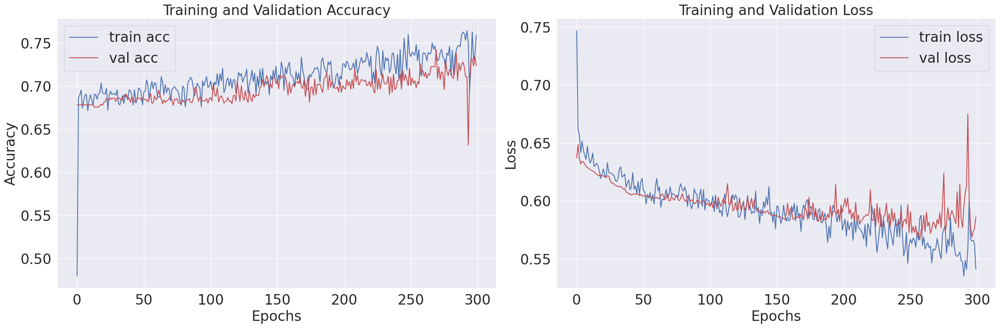

In [ ]:
#出力したテンソルのデバイスをCPUへ切り替える
# GoogleColabの場合は不要
import torch
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 仮にepochsの数をトレーニングデータの長さから取得する
epochs = len(train_acc_list)  # train_acc_listの長さを使用

train_acc = []
train_loss = []
val_acc = []
val_loss = []

# 各リストをnumpy配列に変換し、リストに追加
for i in range(epochs):
    train_acc.append(train_acc_list[i].detach().cpu().numpy())
    train_loss.append(train_loss_list[i].detach().cpu().numpy())
    val_acc.append(val_acc_list[i].detach().cpu().numpy())
    val_loss.append(val_loss_list[i].detach().cpu().numpy())

# グラフ化
sns.set()
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 8))

ax1.plot(range(epochs), train_acc, 'b', label='train acc')
ax1.plot(range(epochs), val_acc, 'r', label='val acc')
ax1.set_title('Training and Validation Accuracy',fontsize=24)
ax1.set_xlabel('Epochs',fontsize=24)
ax1.set_ylabel('Accuracy',fontsize=24)
ax1.legend(fontsize=24)
ax1.tick_params(labelsize=24)

ax2.plot(range(epochs), train_loss, 'b', label='train loss')
ax2.plot(range(epochs), val_loss, 'r', label='val loss')
ax2.set_title('Training and Validation Loss',fontsize=24)
ax2.tick_params(labelsize=24)
ax2.set_xlabel('Epochs',fontsize=24)
ax2.set_ylabel('Loss',fontsize=24)
ax2.legend(fontsize=24)
ax2.tick_params(labelsize=24)
plt.tight_layout()
plt.show()


Extracting validation set logits...


Extracting logits: 100%|██████████| 6/6 [00:02<00:00,  2.57it/s]


Extracting test set logits...


Extracting logits: 100%|██████████| 3/3 [00:01<00:00,  2.40it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/calibration.py:337: UserWarning: The `cv='prefit'` option is deprecated in 1.6 and will be removed in 1.8. You can use CalibratedClassifierCV(FrozenEstimator(estimator)) instead.
  warnings.warn(


Calibrating model...

Validation Set Results:


Calculating confidence interval: 100%|██████████| 1000/1000 [00:01<00:00, 586.95it/s]


Calibrated ROC AUC: 0.7557 [95% CI: 0.7186-0.7928]

Optimal Threshold Analysis (Validation Set):
Optimal threshold: 0.3600
Youden Index: 0.3989
Sensitivity: 0.6026
Specificity: 0.7963
Accuracy: 0.7338
F1-score: 0.5937

Test Set Results:


Calculating confidence interval: 100%|██████████| 1000/1000 [00:01<00:00, 624.02it/s]


Calibrated ROC AUC: 0.7562 [95% CI: 0.7006-0.8122]

Optimal Threshold Analysis (Test Set):
Using validation threshold: 0.3600
Sensitivity: 0.5981
Specificity: 0.8301
Accuracy: 0.7623
F1-score: 0.5953


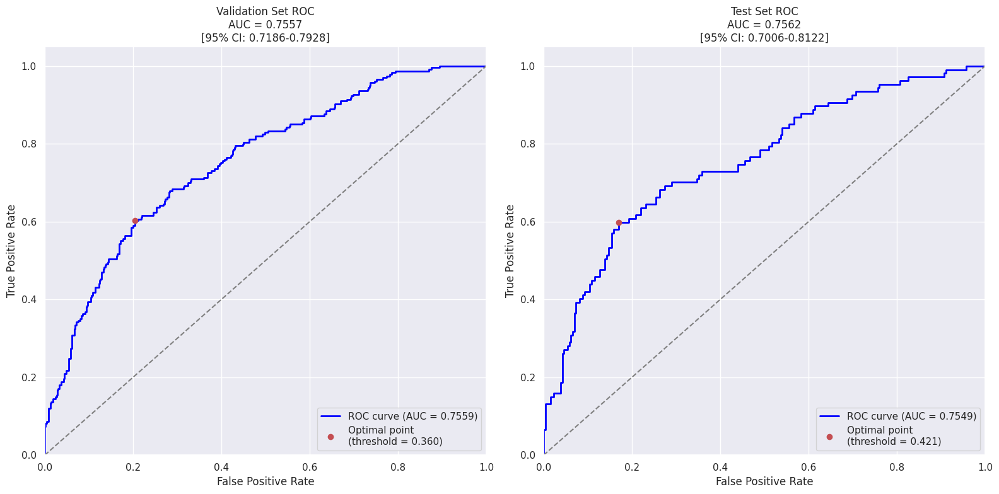

In [ ]:
import glob
import os
import random
import cv2
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.calibration import CalibratedClassifierCV
from scipy import stats
from tqdm import tqdm
import seaborn as sns

def calculate_metrics(y_true, y_pred):
    """
    基本的な評価指標を計算
    """
    TP = np.sum((y_true == 1) & (y_pred == 1))
    TN = np.sum((y_true == 0) & (y_pred == 0))
    FP = np.sum((y_true == 0) & (y_pred == 1))
    FN = np.sum((y_true == 1) & (y_pred == 0))

    accuracy = (TP + TN) / (TP + TN + FP + FN)
    sensitivity = TP / (TP + FN) if (TP + FN) > 0 else 0
    specificity = TN / (TN + FP) if (TN + FP) > 0 else 0
    precision = TP / (TP + FP) if (TP + FP) > 0 else 0
    f1_score = 2 * (precision * sensitivity) / (precision + sensitivity) if (precision + sensitivity) > 0 else 0

    return {
        'accuracy': accuracy,
        'sensitivity': sensitivity,
        'specificity': specificity,
        'precision': precision,
        'f1_score': f1_score
    }

def calculate_roc_auc_ci(y_true, y_pred, n_bootstraps=1000, confidence_level=0.95):
    """
    ROC-AUCスコアとその信頼区間を計算
    """
    bootstrapped_scores = []
    rng = np.random.RandomState(42)

    for i in tqdm(range(n_bootstraps), desc="Calculating confidence interval"):
        indices = rng.randint(0, len(y_true), len(y_true))
        if len(np.unique(y_true[indices])) < 2:
            continue
        score = roc_auc_score(y_true[indices], y_pred[indices])
        bootstrapped_scores.append(score)

    alpha = (1 - confidence_level)
    ci_lower = np.percentile(bootstrapped_scores, alpha/2 * 100)
    ci_upper = np.percentile(bootstrapped_scores, (1 - alpha/2) * 100)

    return np.mean(bootstrapped_scores), ci_lower, ci_upper

def calculate_optimal_threshold(y_true, y_pred_proba):
    """
    Youdenインデックスを用いて最適なカットオフ値を計算
    """
    fpr, tpr, thresholds = roc_curve(y_true, y_pred_proba)
    youden_indices = tpr - fpr
    optimal_idx = np.argmax(youden_indices)
    optimal_threshold = thresholds[optimal_idx]

    y_pred = (y_pred_proba >= optimal_threshold).astype(int)

    TP = np.sum((y_true == 1) & (y_pred == 1))
    TN = np.sum((y_true == 0) & (y_pred == 0))
    FP = np.sum((y_true == 0) & (y_pred == 1))
    FN = np.sum((y_true == 1) & (y_pred == 0))

    sensitivity = TP / (TP + FN)
    specificity = TN / (TN + FP)
    accuracy = (TP + TN) / (TP + TN + FP + FN)
    precision = TP / (TP + FP) if (TP + FP) > 0 else 0
    f1_score = 2 * (precision * sensitivity) / (precision + sensitivity) if (precision + sensitivity) > 0 else 0
    youden_index = sensitivity + specificity - 1

    return {
        'threshold': optimal_threshold,
        'youden_index': youden_index,
        'sensitivity': sensitivity,
        'specificity': specificity,
        'accuracy': accuracy,
        'precision': precision,
        'f1_score': f1_score,
        'confusion_matrix': {
            'TP': TP, 'TN': TN, 'FP': FP, 'FN': FN
        }
    }

def plot_roc_curve_with_optimal_point(y_true, y_pred_proba, title, ax=None):
    """
    ROC曲線と最適カットオフ点をプロット
    """
    fpr, tpr, thresholds = roc_curve(y_true, y_pred_proba)
    auc_score = auc(fpr, tpr)

    optimal_metrics = calculate_optimal_threshold(y_true, y_pred_proba)
    optimal_threshold = optimal_metrics['threshold']

    optimal_idx = np.argmin(np.abs(thresholds - optimal_threshold))
    optimal_fpr = fpr[optimal_idx]
    optimal_tpr = tpr[optimal_idx]

    # 既存のaxを使用するか、新しいfigureを作成
    if ax is None:
        fig, ax = plt.subplots(figsize=(8, 8))

    # プロット処理をax.plotに変更
    ax.plot(fpr, tpr, color='blue', lw=2,
            label=f'ROC curve (AUC = {auc_score:.4f})')
    ax.plot(optimal_fpr, optimal_tpr, 'ro',
            label=f'Optimal point\n(threshold = {optimal_threshold:.3f})')

    ax.plot([0, 1], [0, 1], color='gray', linestyle='--')
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title(title)
    ax.legend(loc="lower right")
    ax.grid(True)

    return optimal_metrics

def extract_logits(model, loader, device):
    """
    モデルからロジットを抽出
    """
    model.eval()
    logits = []
    targets = []
    with torch.no_grad():
        for data, target in tqdm(loader, desc="Extracting logits"):
            data, target = data.to(device), target.to(device)
            output = model(data)
            logits.extend(output.cpu().numpy())
            targets.extend(target.cpu().numpy())
    return np.array(logits), np.array(targets)

def calibrate_and_evaluate(model, valid_loader, test_loader, device):
    """
    モデルのキャリブレーションと評価を実行
    """
    print("Extracting validation set logits...")
    val_logits, val_targets = extract_logits(model, valid_loader, device)

    print("Extracting test set logits...")
    test_logits, test_targets = extract_logits(model, test_loader, device)

    # プラットスケーリングの設定と実行
    print("Calibrating model...")
    calibrator = LogisticRegression(solver='liblinear', max_iter=1000)
    calibrated_model = CalibratedClassifierCV(calibrator, method='sigmoid', cv='prefit')

    calibrator.fit(val_logits, val_targets)
    calibrated_model.fit(val_logits, val_targets)

    # 予測確率の取得
    val_probs = calibrated_model.predict_proba(val_logits)[:, 1]
    test_probs = calibrated_model.predict_proba(test_logits)[:, 1]

    # 検証セットの評価
    print("\nValidation Set Results:")
    val_auc, val_ci_lower, val_ci_upper = calculate_roc_auc_ci(val_targets, val_probs)
    print(f"Calibrated ROC AUC: {val_auc:.4f} [95% CI: {val_ci_lower:.4f}-{val_ci_upper:.4f}]")

    # 検証セットの最適カットオフ値を計算
    val_optimal_metrics = calculate_optimal_threshold(val_targets, val_probs)
    print("\nOptimal Threshold Analysis (Validation Set):")
    print(f"Optimal threshold: {val_optimal_metrics['threshold']:.4f}")
    print(f"Youden Index: {val_optimal_metrics['youden_index']:.4f}")
    print(f"Sensitivity: {val_optimal_metrics['sensitivity']:.4f}")
    print(f"Specificity: {val_optimal_metrics['specificity']:.4f}")
    print(f"Accuracy: {val_optimal_metrics['accuracy']:.4f}")
    print(f"F1-score: {val_optimal_metrics['f1_score']:.4f}")

    # テストセットの評価
    print("\nTest Set Results:")
    test_auc, test_ci_lower, test_ci_upper = calculate_roc_auc_ci(test_targets, test_probs)
    print(f"Calibrated ROC AUC: {test_auc:.4f} [95% CI: {test_ci_lower:.4f}-{test_ci_upper:.4f}]")

    # 検証セットで得られた最適カットオフ値をテストセットに適用
    test_metrics = calculate_optimal_threshold(test_targets, test_probs)
    print("\nOptimal Threshold Analysis (Test Set):")
    print(f"Using validation threshold: {val_optimal_metrics['threshold']:.4f}")
    print(f"Sensitivity: {test_metrics['sensitivity']:.4f}")
    print(f"Specificity: {test_metrics['specificity']:.4f}")
    print(f"Accuracy: {test_metrics['accuracy']:.4f}")
    print(f"F1-score: {test_metrics['f1_score']:.4f}")

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

    val_optimal_metrics = plot_roc_curve_with_optimal_point(
        val_targets, val_probs,
        f"Validation Set ROC\nAUC = {val_auc:.4f}\n[95% CI: {val_ci_lower:.4f}-{val_ci_upper:.4f}]",
        ax=ax1
    )

    test_optimal_metrics = plot_roc_curve_with_optimal_point(
        test_targets, test_probs,
        f"Test Set ROC\nAUC = {test_auc:.4f}\n[95% CI: {test_ci_lower:.4f}-{test_ci_upper:.4f}]",
        ax=ax2
    )

    plt.tight_layout()
    plt.show()

    # モデルを更新
    model.calibrator = calibrated_model

    return {
        'validation': {
            'auc': val_auc,
            'ci_lower': val_ci_lower,
            'ci_upper': val_ci_upper,
            'optimal_metrics': val_optimal_metrics,
            'predictions': val_probs
        },
        'test': {
            'auc': test_auc,
            'ci_lower': test_ci_lower,
            'ci_upper': test_ci_upper,
            'optimal_metrics': test_optimal_metrics,
            'predictions': test_probs
        }
    }

# メインの実行部分
if __name__ == "__main__":
    # モデルのトレーニング後に実行
    results = calibrate_and_evaluate(model, valid_loader, test_loader, device)

In [ ]:
model_save_path = '/content/drive/MyDrive/mcp_joint_checkpoint'
torch.save(model.state_dict(), model_save_path)

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.calibration import CalibratedClassifierCV

def extract_logits(model, loader, device):
    model.eval()
    logits = []
    targets = []
    with torch.no_grad():
        for data, target in loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            logits.extend(output.cpu().numpy())
            targets.extend(target.cpu().numpy())
    return np.array(logits), np.array(targets)

# ロジットとターゲットを抽出
val_logits, val_targets = extract_logits(model, valid_loader, device)

# プラットスケーリングを使用してモデルをカリブレーション
calibrator = LogisticRegression(solver='liblinear', max_iter=1000)
calibrated_model = CalibratedClassifierCV(calibrator, method='sigmoid', cv='prefit')

# 検証セットのロジットとターゲットを使って、ベースのcalibratorをフィッティング
calibrator.fit(val_logits, val_targets)
# 検証セットの確率を使ってフィッティング
calibrated_model.fit(val_logits, val_targets)

# カリブレーション後の確率を評価
calibrated_probs = calibrated_model.predict_proba(val_logits)[:, 1]

# パフォーマンス評価
roc_auc = roc_auc_score(val_targets, calibrated_probs)
print(f"Calibrated ROC AUC: {roc_auc:.4f}")

# 保存や他の用途で使用するためにモデルを更新
model.calibrator = calibrated_model

Calibrated ROC AUC: 0.7559


/usr/local/lib/python3.10/dist-packages/sklearn/calibration.py:337: UserWarning: The `cv='prefit'` option is deprecated in 1.6 and will be removed in 1.8. You can use CalibratedClassifierCV(FrozenEstimator(estimator)) instead.
  warnings.warn(


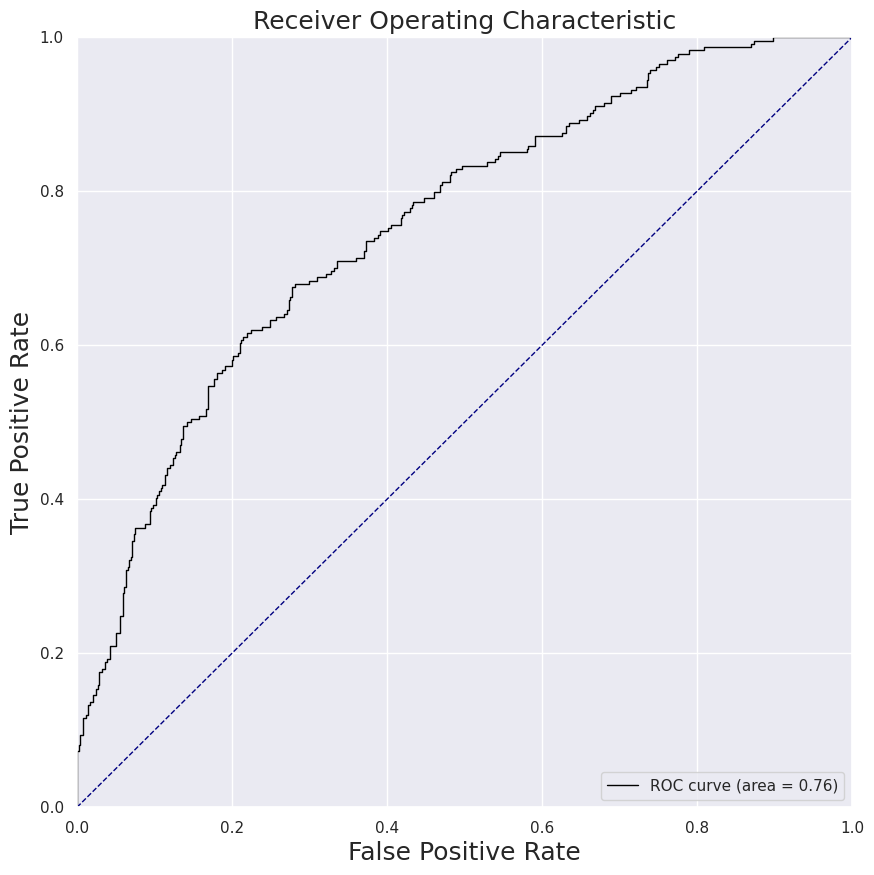

In [ ]:
from sklearn.metrics import roc_curve, auc
def plot_roc_curve(model, loader, device):
    # 真のラベルと予測確率を収集
    true_labels = []
    pred_probs = []

    model.eval()
    with torch.no_grad():
        for data, labels in loader:
            data = data.to(device)
            labels = labels.to(device)
            outputs = model(data)
            # ソフトマックスを適用して確率を取得
            probabilities = torch.nn.functional.softmax(outputs, dim=1)
            pred_probs.extend(probabilities[:, 1].cpu().numpy())  # クラス1の確率を取得
            true_labels.extend(labels.cpu().numpy())

    # ROCカーブの計算
    fpr, tpr, thresholds = roc_curve(true_labels, pred_probs)
    roc_auc = auc(fpr, tpr)

    # ROCカーブの描画
    plt.figure(figsize=(10, 10))
    lw = 1
    plt.plot(fpr, tpr, color='black',
             lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 2], [0, 2], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate',fontsize=18)
    plt.ylabel('True Positive Rate',fontsize=18)
    plt.title('Receiver Operating Characteristic',fontsize=18)
    plt.legend(loc="lower right")
    plt.show()

# 使用例: 有効データローダーとデバイス情報を指定してROC曲線を描画
plot_roc_curve(model, valid_loader, device)


In [ ]:
import pickle
# カリブレーターの保存
with open('/content/drive/MyDrive/mcp_joint.pkl', 'wb') as f:
    pickle.dump(calibrated_model, f)

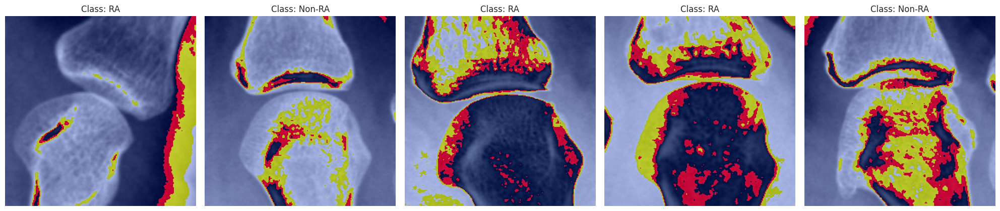

112222

In [ ]:
class GradCam:
    def __init__(self, model, device):
        self.model = model
        self.feature = None
        self.gradient = None
        self.device = device

        def forward_hook(module, input, output):
            self.feature = output.detach()

        def backward_hook(module, grad_in, grad_out):
            self.gradient = grad_out[0].detach()

        # Swin Transformerの最後のブロックを取得
        if hasattr(model, 'layers'):
            target_layer = model.layers[-1].blocks[-1]
            target_layer.register_forward_hook(forward_hook)
            target_layer.register_full_backward_hook(backward_hook)
        else:
            raise ValueError("Unexpected model architecture")

    def __call__(self, x):
        self.feature = None
        self.gradient = None

        x = x.to(self.device)

        output = self.model(x)
        pred_class = output.argmax(dim=1)

        self.model.zero_grad()
        one_hot = torch.zeros_like(output)
        one_hot[0, pred_class] = 1
        output.backward(gradient=one_hot)

        # Swin Transformerの特徴量マップの形状に合わせて処理
        feature_map = self.feature
        gradient_map = self.gradient

        # 重みの計算
        weights = gradient_map.mean(dim=(2, 3))  # Swinの場合、spatial dimensionsで平均を取る

        # CAMの計算
        batch_size = feature_map.shape[0]
        height = feature_map.shape[2]
        width = feature_map.shape[3]

        cam = torch.mul(feature_map, weights.view(batch_size, -1, 1, 1))
        cam = cam.sum(dim=1)  # チャネル方向に集約

        # 正規化とReLU
        cam = F.relu(cam)
        cam = cam.squeeze().cpu().numpy()

        # 元の画像サイズにリサイズ
        cam = cv2.resize(cam, (224, 224))
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-7)

        return cam

def overlay_heatmap_to_image(image, heatmap):
    image = ((image.permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5) * 255).astype(np.uint8)

    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

    alpha = 0.2
    overlayed = cv2.addWeighted(image, 1 - alpha, heatmap_colored, alpha, 0)

    return overlayed / 255.0

# 実行部分
grad_cam = GradCam(model, device)

images, labels = next(iter(test_loader))
images = images[:5]
labels = labels[:5]

plt.figure(figsize=(20, 5))

for i, (image, label) in enumerate(zip(images, labels)):
    try:
        heatmap = grad_cam(image.unsqueeze(0))
        overlayed = overlay_heatmap_to_image(image, heatmap)

        plt.subplot(1, 5, i+1)
        plt.imshow(overlayed)
        plt.title(f'Class: {"RA" if label.item() == 1 else "Non-RA"}')
        plt.axis('off')
    except Exception as e:
        print(f"Error processing image {i}: {str(e)}")

plt.tight_layout()
plt.show()

torch.cuda.empty_cache()
gc.collect()

<ipython-input-15-ee548b2a3759>:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('/content/drive/MyDrive/mcp_joint_checkpoint'))


Overall Accuracy: 0.723


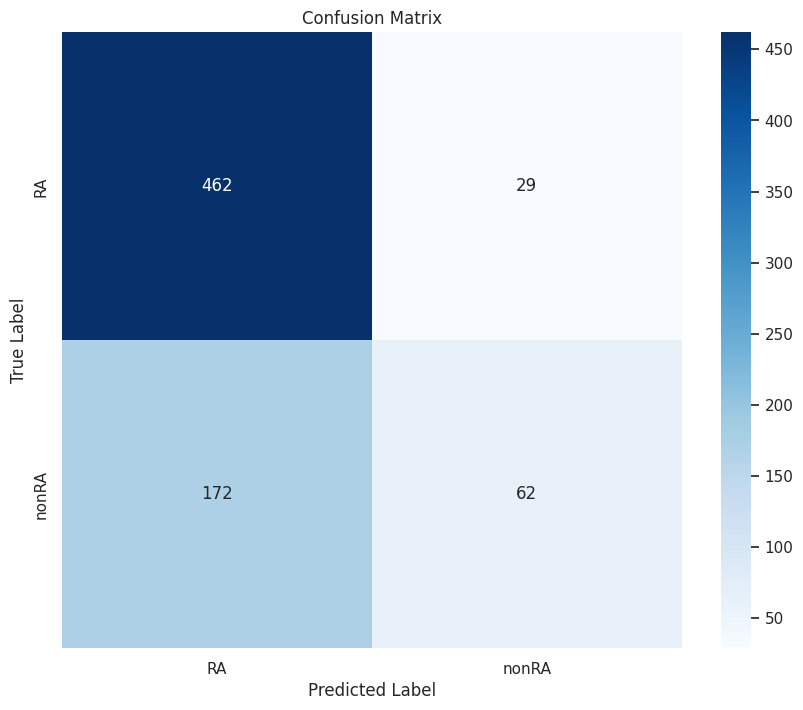

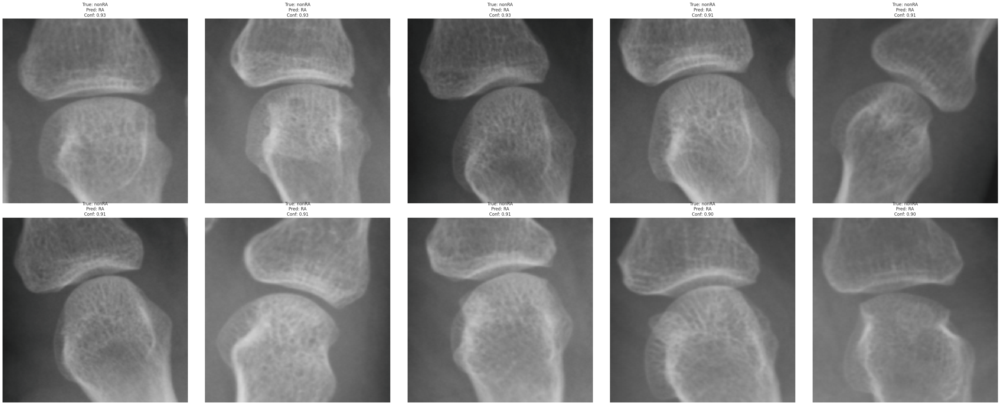

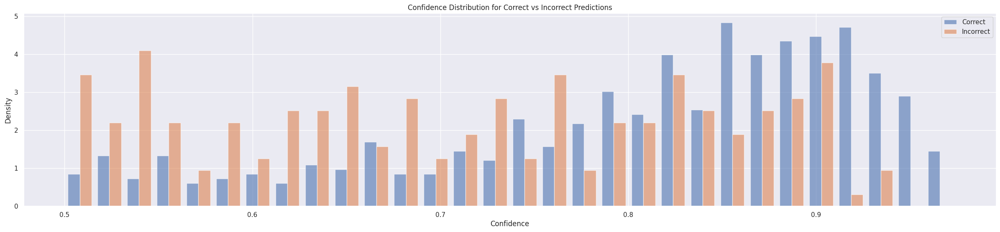


Class RA:
Accuracy: 0.941
Average confidence: 0.812
Samples: 491

Class nonRA:
Accuracy: 0.265
Average confidence: 0.714
Samples: 234


In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from torchvision.utils import make_grid
import torch
import torch.nn as nn
from torch.utils.data import DataLoader

def get_predictions(model, val_loader, device):
    model.eval()
    predictions = []
    true_labels = []
    confidences = []
    images_list = []

    with torch.no_grad():
        for images, labels in val_loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            conf, preds = torch.max(probs, dim=1)

            predictions.extend(preds.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())
            confidences.extend(conf.cpu().numpy())
            images_list.extend(images.cpu())

    return np.array(predictions), np.array(true_labels), np.array(confidences), images_list

def plot_confusion_matrix(true_labels, predictions, class_names):
    cm = confusion_matrix(true_labels, predictions)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

def analyze_misclassifications(true_labels, predictions, confidences, images_list, class_names):
    misclassified_idx = np.where(predictions != true_labels)[0]

    if len(misclassified_idx) == 0:
        print("No misclassified samples found!")
        return

    sorted_idx = sorted(misclassified_idx,
                       key=lambda x: confidences[x],
                       reverse=True)

    n_samples = min(10, len(sorted_idx))
    fig, axes = plt.subplots(2, 5, figsize=(40, 16))
    axes = axes.ravel()

    for idx, ax in enumerate(axes):
        if idx < n_samples:
            mis_idx = sorted_idx[idx]
            image = images_list[mis_idx]
            true_label = class_names[true_labels[mis_idx]]
            pred_label = class_names[predictions[mis_idx]]
            conf = confidences[mis_idx]

            # 画像の正規化を元に戻す（必要に応じて調整）
            image = image.permute(1, 2, 0)
            image = image * torch.tensor([0.229, 0.224, 0.225]) + torch.tensor([0.485, 0.456, 0.406])
            image = torch.clamp(image, 0, 1)

            ax.imshow(image)
            ax.set_title(f'True: {true_label}\nPred: {pred_label}\nConf: {conf:.2f}')
            ax.axis('off')

    plt.tight_layout()
    plt.show()

def plot_confidence_distribution(confidences, predictions, true_labels):
    plt.figure(figsize=(30, 6))

    correct = confidences[predictions == true_labels]
    incorrect = confidences[predictions != true_labels]

    plt.hist([correct, incorrect], label=['Correct', 'Incorrect'],
             bins=30, alpha=0.6, density=True)
    plt.xlabel('Confidence')
    plt.ylabel('Density')
    plt.title('Confidence Distribution for Correct vs Incorrect Predictions')
    plt.legend()
    plt.show()

# メインの実行コード
def main():
    # デバイスの設定
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    # クラス名の設定（あなたのデータセットに合わせて修正）
    class_names = ['RA', 'nonRA']  # あなたのクラス名に置き換えてください

    model = timm.create_model(
        'swin_base_patch4_window7_224.ms_in1k',
        pretrained=False,
        num_classes=2,
    )

    # モデルの読み込み（あなたの保存したモデルのパスに修正）
    model.load_state_dict(torch.load('/content/drive/MyDrive/mcp_joint_checkpoint'))
    model = model.to(device)

    # 予測の実行
    predictions, true_labels, confidences, images_list = get_predictions(model, val_loader, device)

    # 全体の性能メトリクス
    accuracy = np.mean(predictions == true_labels)
    print(f"Overall Accuracy: {accuracy:.3f}")

    # 混同行列の表示
    plot_confusion_matrix(true_labels, predictions, class_names)

    # 誤分類サンプルの表示
    analyze_misclassifications(true_labels, predictions, confidences, images_list, class_names)

    # 確信度分布の表示
    plot_confidence_distribution(confidences, predictions, true_labels)

    # クラスごとの詳細な分析
    for i, class_name in enumerate(class_names):
        class_mask = true_labels == i
        class_acc = np.mean(predictions[class_mask] == true_labels[class_mask])
        print(f"\nClass {class_name}:")
        print(f"Accuracy: {class_acc:.3f}")
        print(f"Average confidence: {np.mean(confidences[class_mask]):.3f}")
        print(f"Samples: {np.sum(class_mask)}")

if __name__ == '__main__':
    val_loader = DataLoader(valid_dataset, batch_size=32, shuffle=False)  # あなたの検証用DataLoaderを設定

    main()